Diffraction removal
time series data
1 case of SDC with core only in all SG bands 1 case of SDC with 5LPI in all SG bands 1 case of SDC+removal diffraction with 5LPI in all SG bands
exp_time = 0.6 s

In [1]:
import glob
import os
import pdb

import astropy
import matplotlib.pyplot as plt
import muse
import numpy as np
import scipy
import xarray as xr
# from muse.inversions.inversions import mass_screen_gcompile
# from muse.utils.sdc_benchmark import sdc_benchmark as bench
from skglm import Lasso, ElasticNet
from sklearn.linear_model import LassoLars as LassoLars
from sklearn.linear_model import Ridge as Ridge

In [2]:
from matplotlib import colors
from muse.synthesis.synthesis import add_noise_poisson, add_noise_readout, exposure_time, vdem_synthesis
from muse.instr.utils import sum_lines_per_channel
# from muse.inversions.inversions import ci_data_driven_mask

In [3]:
import contextlib
import os
import platform
import time
import warnings
from datetime import datetime
from pathlib import Path

import dask
import numpy as np
import xarray as xr
from dateutil.tz import gettz
from matplotlib import pyplot as plt

from muse import logger
from muse.instr.utils import (
    ci2sg_response_format,
    convert_resp2muse_resp,
    create_resp_func,
    create_resp_line_list,
    sum_lines_per_channel,
    sum_lines_slits_per_channel,
)
from muse.inversions.inversions import mask_response, vdem_solve
from muse.synthesis.synthesis import (
    add_noise_poisson,
    add_noise_readout,
    calc_error,
    exposure_time,
    ph2dn,
    transform_resp_units,
    vdem_synthesis,
)
from muse.transforms.transforms import muse_fov, reshape_rs2x, reshape_x2rs
from muse.utils.fitting import gaussian_fitting_analysis, masker
# from muse.utils.forward_pipeline import get_muse_version
from muse.utils.miscellaneous import (
    get_moment_limits,
    get_outliers_newer,
    plot_nine_conts,
    plot_slit_cont_maps,
    plot_with_chisquare,
)
from muse.utils.utils import confusion_masked, read_response, sub_contaminants


In [4]:
model_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/"
model_name="muse_vdem_m-flare-muram_los2_trac_565000.zarr"
resp_path_sg="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_with_slits/"
resp_path_ci="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_CI/"
FeXIX_108_resp="respfunc_108_FeXIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
FeXXI_108_resp="respfunc_108_FeXXI_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
contam_108_resp="respfunc_108-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
FeIX_171_resp="respfunc_171_FeIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
contam_171_resp="respfunc_171-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
FeXV_284_resp="respfunc_284_FeXV_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
contam_284_resp="respfunc_284-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
ci_195_resp="respfunc_195_CI_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
syn_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/"
effect_path="/Volumes/Space/MUSE_GCP/muse_response_function/effective_area/25_oct_2025/"
effect_area_108="effective_area_band_108_JMS_2024-10-31.zarr"
effect_area_171="effective_area_band_171_JMS_2024-10-31.zarr"
effect_area_284="effective_area_band_284_JMS_2024-10-31.zarr"
obs_filename_ci=None
obs_filename_sg=None
gt_filename_sg=None
serial_gfat=False
run_SDC=True
serial_SDC=False
run_mask=None  # ["gt_vdem" "redundant" "intensity" "data_driven"]
redundant_mask=None
velbin_inv=None
tgbin_inv=None
ntgbin_inv=None
rotate=False
saturation=None
KEYS=None  # [None"middle""bottom" "all"]
target=None  # ["QS""AR""FL"]
jump_pix=None  # [1010] Jump in y-axis and t-step
logT=None
vdop=None
logT_inv=None
vdop_inv=None
nslits=35
model=None
model2=None
data_driven_mask_model=None
data_driven_mask_keyword=None
exp_time=0.6
noise=False
noise_seed=123456789
readoutnoise=2.24
compression: int = 1
npix=2
max_vel=50
velocity_range=50
velocity_range_gt=400
velocity_range_guided=None
intensity_scaling=None  # ["noise" "no_noise" None]
response_info="0.390/0.780 A"
line=None
savefigs=True
savepath="./"
save_id=""
savelogfile="sdc_benchmark.json"
logger=logger
save_output=False
save_output_netcdf=False
author="JMS"
appendlog=None
disable_pbar=False
run_cont_id=False
dens_eff=1e9  # The VDEM could be expanded to include density dependence (and the response function)
pres_eff=3e15  # The VDEM could be expanded to include density dependence (and the response function)
lgtgmin_eff=4.8
int_cont_ratio=1e2
main_lines_cont=None
n_cont_top=20
cuda_device=3
pad_value=3
response_scaling=None  # "auto" None
unmask_outliers=True
randomizeSVD=True
muse_fov_mode="wrap"
thresholds_ph=None
thresholds_dn=None
passbands_to_solve=None

In [5]:
dpth_vdem_m_flare="/Users/khcho/MUSE/m_flare_vdem/"

FeXIX_108_resp="respfunc_108_FeXIX108.355_nslits35_sep389.0_sun_coronal_2021_chianti_coatingOptixFab_pressure_3000000000000000.0_JDP_2025-07-24.zarr"
FeXXI_108_resp="respfunc_108_FeXXI108.117_nslits35_sep389.0_sun_coronal_2021_chianti_coatingOptixFab_pressure_3000000000000000.0_JDP_2025-07-24.zarr"
contam_108_resp="respfunc_108_L_nslits35_sep389.0_sun_coronal_2021_chianti_coatingOptixFab_pressure_3000000000000000.0_JDP_2025-07-24.zarr"
FeIX_171_resp="respfunc_171_nslits35_sep389.0_sun_coronal_2021_chianti_coatingOptixFab_pressure_3000000000000000.0_JDP_2025-07-24.zarr"
contam_171_resp="respfunc_171_L_nslits35_sep389.0_sun_coronal_2021_chianti_coatingOptixFab_pressure_3000000000000000.0_JDP_2025-07-24.zarr"
FeXV_284_resp="respfunc_284_nslits35_sep389.0_sun_coronal_2021_chianti_coatingOptixFab_pressure_3000000000000000.0_JDP_2025-07-24.zarr"
contam_284_resp="respfunc_284_L_nslits35_sep389.0_sun_coronal_2021_chianti_coatingOptixFab_pressure_3000000000000000.0_JDP_2025-07-24.zarr"
ci_195_resp="respfunc_ci_195_sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JDP_2025-07-24.zarr"
dpth_resp="/Users/khcho/MUSE/response/"

In [6]:
base_path = '/Users/khcho/MUSE/diffraction/time_series'
os.chdir(base_path)
import sys
sys.path.append(base_path)
import importlib

In [7]:
## parameters

model_path=dpth_vdem_m_flare
model_name='muse_vdem_m-flare-muram_los2_trac_fixedvdop_JMS_2May2025_555806.zarr'
resp_path_sg=dpth_resp
resp_path_ci=dpth_resp
# resp_path_ci=None 
FeXIX_108_resp=FeXIX_108_resp
FeXXI_108_resp=FeXXI_108_resp
contam_108_resp=contam_108_resp
FeIX_171_resp=FeIX_171_resp
contam_171_resp=contam_171_resp
FeXV_284_resp=FeXV_284_resp
contam_284_resp=contam_284_resp
ci_195_resp=ci_195_resp
# ci_195_resp=None
#velbin_inv=5 #[5,10,15,20,30]
vdop = np.arange(-500, 510, 10)   #controls VDEM and Response Functions (no noise exp.)
vdop_inv = np.arange(-500, 510, 10) #controls only Response Functions in the inversions (fixed no noise exp.)

velocity_range = 80 
velocity_range_guided = 400 

run_SDC=True
serial_SDC=False
exp_time=0.6    #noise exp: 0.1, 0.6, 1.8 s
obs_filename_ci=None
obs_filename_sg=base_path+'/specsum_only_core.zarr'
gt_filename_sg=base_path+'/specsum_gt.zarr'
syn_path="./"
KEYS=['all']
# jump_pix = [16 16] 
line=['Fe IX', 'Fe XV', 'Fe XIX 108.355']
intensity_scaling="no_noise"
# model = Lasso(alpha=1e-3, positive=True, fit_intercept=False, max_epochs=500) 

alpha_L1 = 1e-1
alpha_L2 = 1e-3
l1_ratio = 1/(2*alpha_L2/alpha_L1+1)
alpha = 2*alpha_L2 + alpha_L1
model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_epochs=500, positive=True, fit_intercept=False)

run_mask = None 
savefigs=True
savepath=base_path
noise = True   #noise exp
save_output = True
save_id=f'only_core' 


In [8]:
from muse.utils.sdc_benchmark import load_and_concat_responses, add_ci_response

In [9]:
vdem_list = sorted(glob.glob(dpth_vdem_m_flare+'/vdem*.zarr'))
folders = [aa.split('.')[0][-6:] for aa in vdem_list]

In [10]:
real_vdem_list = [a for a, b in zip(vdem_list, folders) if 555000 < int(b) < 579000]
snapshots = [a for a in folders if 555000 < int(a) < 579000]

In [11]:
real_vdem_list

['/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_555241.zarr',
 '/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_555489.zarr',
 '/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_555725.zarr',
 '/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_555953.zarr',
 '/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_556177.zarr',
 '/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_556392.zarr',
 '/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_556606.zarr',
 '/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_556826.zarr',
 '/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_557038.zarr',
 '/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_557272.zarr',
 '/Users/khcho/MUSE/m_flare_vdem/vdem_MURaM_M-Flare_x_557495.zarr']

In [12]:
# kargs={"oversample_x": 3, "slit_dim": 404, "lpi": 70, "fwhm": 0.5, "transmission": 0.81}
kargs={"oversample_x": 3, "slit_dim": 404, "lpi": 5, "fwhm": 0.5, "transmission": 0.97}
if True:
    response = load_and_concat_responses(
        resp_dir=resp_path_sg,
        resp_files=[
            FeXIX_108_resp,
            FeXXI_108_resp,
            contam_108_resp,
            FeIX_171_resp,
            contam_171_resp,
            FeXV_284_resp,
            contam_284_resp,
        ],
        logT=logT,
        vdop=vdop,
        slit=np.arange(nslits),
        logTmethod='nearest',
        channels=[108, 108, 108, 171, 171, 284, 284],
    )
    logT = response.logT
    vdop = response.vdop
    
    response = add_ci_response(response, ci_195_resp, resp_path_ci, logT, vdop).squeeze()

    response["SG_resp"] = response.SG_resp.fillna(0.0)
    response.to_zarr(base_path+'/response.zarr', mode='w')

    # vdem_list = sorted(glob.glob(dpth_vdem_m_flare+'/vdem*549*.zarr'))
    for k, model_name in enumerate(real_vdem_list):
        # scene_num = model_name.split('.')[0][-6:]
        try:
            os.mkdir(base_path+'/'+snapshots[k])
        except:
            pass
        vdem_muse_fov = xr.open_dataset(str(Path(model_path) / model_name)).compute()
        vdem_muse_fov.vdem.attrs['units'] = vdem_muse_fov.vdem.attrs['units'].replace(' cm5', ' / cm5')
        vdem_muse_fov = muse_fov(vdem_muse_fov, rotate=None, mode=muse_fov_mode)
        vdem_muse_fov_rs = reshape_x2rs(vdem_muse_fov)
        vdem_muse_fov_rs = vdem_muse_fov_rs.sel(logT=response.logT, vdop=response.vdop, drop=True, method="nearest")
        # vdem_muse_fov_rs = vdem_muse_fov_rs.interp(vdop=vdop).fillna(0.0)
        
        spectrum_synthesis = vdem_synthesis(
                             vdem_muse_fov_rs,
                             response,
                             sum_over=["logT", "vdop"],
        )
        
        from muse.instr.psf import convolve_model_psf
        from muse.instr.utils import sum_lines_per_channel, sum_lines_slits_per_channel
        from muse.synthesis.synthesis import vdem_syn_join_slits_wvl
        from muse.instr.gausslobes import gausslobes
        from muse.transforms.transforms import muse_interp_xyw2rssg
        
        spec_gt = exposure_time(spectrum_synthesis, exp_time=exp_time)
        spec_gt.to_zarr(base_path+'/'+snapshots[k]+'/spec_gt.zarr', mode='w')
        spec_gt_noise = add_noise_poisson(spec_gt, response=response, seed=noise_seed)
        spec_gt_noise = ph2dn(spec_gt_noise, response=response)
        spec_gt_noise = add_noise_readout(spec_gt_noise, response=response, 
                                          compression=compression, seed=noise_seed)
        spec_gt_noise.to_zarr(base_path+'/'+snapshots[k]+'/spec_gt_noise.zarr', mode='w')
    
        line = response.line[[0, 3, 5]].values
        spec_merge_line = vdem_syn_join_slits_wvl(response, vdem_muse_fov_rs, line=line)
        spec_merge_line['gain'] = xr.DataArray([10, 10, 10], coords={'channel':spec_merge_line.channel}, dims='channel')
        
        spec_with_diff = convolve_model_psf(spec_merge_line,model=gausslobes,**kargs, channel=[108,171,284])
        muse_spec_diff, resp = muse_interp_xyw2rssg(spec_with_diff,response, line=line)
        muse_spec_diff['gain'] = xr.DataArray([10, 10, 10], coords={'channel':muse_spec_diff.channel}, dims='channel')
    
        specsum_diff = exposure_time(muse_spec_diff, exp_time=exp_time)
        specsum_diff = add_noise_poisson(specsum_diff, response=response, seed=noise_seed)
        specsum_diff = ph2dn(specsum_diff, response)
        specsum_diff = sum_lines_slits_per_channel(specsum_diff)
        specsum_diff = add_noise_readout(specsum_diff, response=response, seed=noise_seed)
        # specsum_diff = specsum_diff.swap_dims({'line':'channel'})
        specsum_diff.to_zarr(base_path+'/'+snapshots[k]+'/specsum_diff.zarr', mode='w')
        
        spec_only_core = convolve_model_psf(spec_merge_line,model=gausslobes,**kargs, channel=[108,171,284],only_core=[True]*3)
        muse_spec_only_core, resp = muse_interp_xyw2rssg(spec_only_core,response, line=line)
        muse_spec_only_core['gain'] = xr.DataArray([10, 10, 10], coords={'channel':muse_spec_only_core.channel}, dims='channel')
        
        specsum_only_core = exposure_time(muse_spec_only_core, exp_time=exp_time)
        specsum_only_core = add_noise_poisson(specsum_only_core, response=response, seed=noise_seed)
        specsum_only_core = ph2dn(specsum_only_core, response)
        specsum_only_core = sum_lines_slits_per_channel(specsum_only_core)
        specsum_only_core = add_noise_readout(specsum_only_core, response=response, seed=noise_seed)
        # specsum_only_core = specsum_only_core.swap_dims({'line':'channel'})
        specsum_only_core.to_zarr(base_path+'/'+snapshots[k]+'/specsum_only_core.zarr', mode='w')
    
        spec_slit_only_core_no_noise = exposure_time(muse_spec_only_core, exp_time=exp_time)
        spec_slit_only_core_no_noise['flux'] = spec_slit_only_core_no_noise['flux'].astype(int)
        spec_slit_only_core_no_noise.to_zarr(base_path+'/'+snapshots[k]+'/spec_slit_only_core_no_noise.zarr', mode='w')
        spec_slit_only_core = add_noise_poisson(spec_slit_only_core_no_noise, response=response, seed=noise_seed)
        spec_slit_only_core = ph2dn(spec_slit_only_core, response)
        # spec_slit_only_core = add_noise_readout(spec_slit_only_core, response=response, seed=noise_seed)
    
        spec_slit_only_core = spec_slit_only_core.swap_dims({'line':'channel'})
        for ichannel in spec_slit_only_core.channel:
            for islit in spec_slit_only_core.slit:
                spec_slit_only_core['flux'].loc[{'slit':islit, 'channel':ichannel}] \
                    += specsum_only_core.readout_noise.sel(channel=ichannel)
        
    
        spec_slit_only_core.to_zarr(base_path+'/'+snapshots[k]+'/spec_slit_only_core.zarr', mode='w')

else: 
    response = xr.open_zarr(base_path+'/response.zarr').compute()
#     spec_gt = xr.open_zarr(base_path+'/specsum_gt.zarr').compute()
#     specsum_diff = xr.open_zarr(base_path+'/specsum_diff.zarr').compute()
#     specsum_only_core = xr.open_zarr(base_path+'/specsum_only_core.zarr').compute()
#     spec_slit_only_core = xr.open_zarr(base_path+'/spec_slit_only_core.zarr').compute()
#     spec_gt_noise = xr.open_zarr(base_path+'/specsum_gt_noise.zarr').compute()

In [13]:
response = response.reset_coords('SG_wvl')

In [14]:
if True:
    for k, model_name in enumerate(real_vdem_list):
        file = f'{base_path}/{snapshots[k]}/spec_slit_only_core.zarr'
        spec = xr.open_zarr(file).compute()
        mom_slit_only_core = gaussian_fitting_analysis(
            spec,
            response,
            line_channel_key=spec.line[[0, 3, 5]].values,
            kwargs_obs={"npix": npix, "velocity_range": velocity_range_gt, "serial": serial_gfat})
        mom_slit_only_core.to_zarr(f'{base_path}/{snapshots[k]}/mom_gt.zarr', mode='w')
else:
    pass

AttributeError: 'Dataset' object has no attribute 'line'

In [ ]:
import matplotlib.animation as animation 
plt.rcParams["animation.html"] = "jshtml"

import matplotlib as mpl

# mom_files = sorted(glob.glob(base_path+'/549*/mom_slit_only_core.zarr'))
mom_files = [f'{base_path}/{k}/mom_slit_only_core.zarr' for k in snapshots]

fig, ax = plt.subplots(3, 3, figsize=(10, 5))
parameters = ['net_flux', 'velocity', 'linewidth']
moments = xr.open_zarr(mom_files[0]).compute()
im = []
for k in range(3):
    mom = moments.isel(line=k).squeeze()
    im00 = ax[0][k].imshow(mom['net_flux'], norm=mpl.colors.LogNorm(1, 1e5), cmap='jet', 
                           extent=[0, mom.x[-1], 0, mom.y[-1]])
    im01 = ax[1][k].imshow(mom['velocity'], vmin=-40, vmax=40, cmap='RdBu_r', 
                           extent=[0, mom.x[-1], 0, mom.y[-1]])
    im02 = ax[2][k].imshow(mom['linewidth'], vmin=20, vmax=100, cmap='hot', 
                           extent=[0, mom.x[-1], 0, mom.y[-1]])
    im.append([im00, im01, im02])
cb_labels = ['DN', 'km/s', 'km/s']
pad = 0.01
for j in range(3):
    ax_pos = ax[j][2].get_position()
    cax = fig.add_axes([ax_pos.x1+pad, ax_pos.y0, 0.01, ax_pos.height])
    cb01 = fig.colorbar(im[2][j], cax=cax, label=cb_labels[j], pad=pad)
    ax[0][j].set(title=moments.line[j].values)
ax[2][0].set(xlabel='Solar X (arcsec)', ylabel='Solar Y (arcsec)')
t01 = fig.text(0.7, 0.05, f'Snapshot No: {snapshots[0]}')

def animate(i):
    moments = xr.open_zarr(mom_files[i]).compute().squeeze()
    for k in range(3):
        for j, param in enumerate(parameters):
            im[k][j].set_data(moments[param].isel(line=k))
    t01.set_text(f'Snapshot No: {snapshots[i]}')
ani = animation.FuncAnimation(fig, animate, frames=range(len(mom_files)), interval=5e2)
ani.save(filename=base_path+'/moments_time_serise.mp4', writer='ffmpeg', dpi=200)
ani
# plt.tight_layout()

In [ ]:
# merging
target_list = ['spec_slit_only_core_no_noise.zarr', 
               'specsum_diff.zarr', 
               'specsum_only_core.zarr']
for target in target_list:
    files = [f'{base_path}/{a}/{target}' for a in snapshots]
    sav_name = target.replace('.', '_time.')
    dum = xr.open_zarr(files[0]).compute()
    for i, snapshot in enumerate(snapshots[1:], start=1):
        dum['flux'].loc[dict(step=i)] = xr.open_zarr(file).compute().flux.sel(step=i)
    dum.assign_coords(snapshot=('step', snapshots))
    dum.to_zarr(f'{base_path}/{sav_name}', mode='w')

In [26]:
spec_slit_only_core_no_noise_time = xr.open_zarr(base_path+'/spec_slit_only_core_no_noise_time.zarr').compute()
specsum_diff_time = xr.open_zarr(base_path+'/specsum_diff_time.zarr').compute()
specsum_only_core_time = xr.open_zarr(base_path+'/specsum_only_core_time.zarr').compute()

In [13]:
from importlib import reload
import muse.instr.mono_diffraction
reload(muse.instr.mono_diffraction)
from muse.instr.mono_diffraction import (
    remove_diffraction_mono, 
    create_xyw_cube, 
    diffraction_removal_from_cube,
    create_spectrum_from_cube)


In [14]:
if True:
    spec_diff_removed = remove_diffraction_mono(
        specsum_diff, response, gausslobes_kwarg=kargs, channel=specsum_diff.channel[:3])

    spec_diff_removed.to_zarr(base_path+'/spec_diff_removed', mode='w')
else:
    spec_diff_removed = xr.open_zarr(base_path+'/spec_diff_removed').compute()

In [15]:
if True:
    mom_diff_removed = gaussian_fitting_analysis(
        spec_diff_removed,
        response,
        line_channel_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
    mom_diff_removed.to_zarr(base_path+'/mom_diff_removed', mode='w')
else:
    mom_diff_removed = xr.open_zarr(base_path+'/mom_diff_removed').compute()

In [16]:
if True:
    mom_only_core = gaussian_fitting_analysis(
        specsum_only_core,
        response,
        line_channel_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
    mom_only_core.to_zarr(base_path+'/mom_only_core', mode='w')
else:
    mom_only_core = xr.open_zarr(base_path+'/mom_only_core').compute()

In [17]:
if True:
    mom_diff = gaussian_fitting_analysis(
        specsum_diff,
        response,
        line_channel_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
    mom_diff.to_zarr(base_path+'/mom_diff', mode='w')
else:
    mom_diff = xr.open_zarr(base_path+'/mom_diff').compute()

In [18]:
if True:
    mom_gt = gaussian_fitting_analysis(
        spec_gt,
        response,
        line_channel_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_gt, "serial": serial_gfat})
    mom_gt.to_zarr(base_path+'/mom_gt', mode='w')
else:
    mom_gt = xr.open_zarr(base_path+'/mom_gt').compute()

/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/opti

In [19]:
if True:
    mom_slit_only_core = gaussian_fitting_analysis(
        spec_slit_only_core,
        response,
        line_channel_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_gt, "serial": serial_gfat})
    mom_slit_only_core.to_zarr(base_path+'/mom_slit_only_core', mode='w')
else:
    mom_slit_only_core = xr.open_zarr(base_path+'/mom_slit_only_core').compute()

/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/opti

In [20]:
if True:
    mom_slit_only_core_no_noise = gaussian_fitting_analysis(
        spec_slit_only_core_no_noise,
        response,
        line_channel_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_gt, "serial": serial_gfat})
    mom_slit_only_core.to_zarr(base_path+'/mom_slit_only_core_no_noise', mode='w')
else:
    mom_slit_only_core = xr.open_zarr(base_path+'/mom_slit_only_core_no_noise').compute()

/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/opti

In [25]:
pn = colors.PowerNorm(0.3)

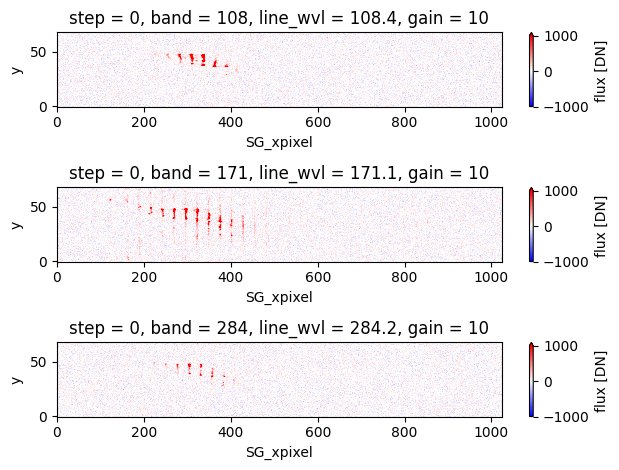

In [26]:
fig, ax = plt.subplots(3, 1)
for i in range(3):
    (specsum_diff - spec_slit_only_core.sum('slit')).flux.isel(channel=i, step=0)\
        .plot(vmin=-1e3, vmax=1e3, cmap='bwr', ax=ax[i])
plt.tight_layout()    

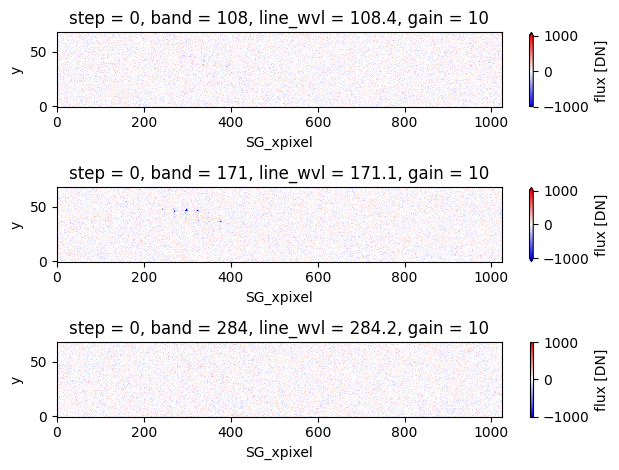

In [27]:
fig, ax = plt.subplots(3, 1)
for i in range(3):
    (spec_diff_removed - spec_slit_only_core.sum('slit')).flux.isel(channel=i, step=0)\
        .plot(vmin=-1e3, vmax=1e3, cmap='bwr', ax=ax[i])
plt.tight_layout()    

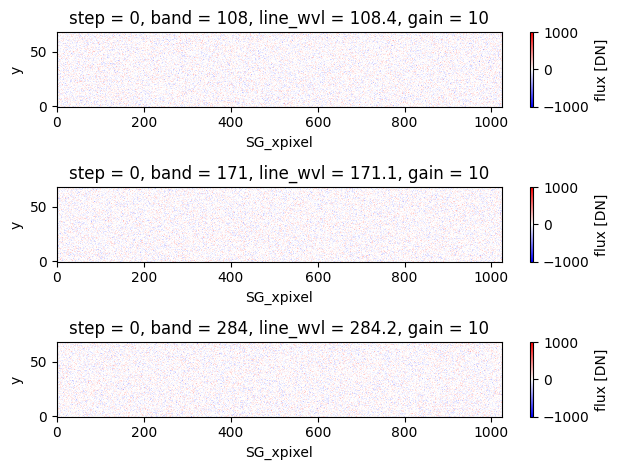

In [28]:
fig, ax = plt.subplots(3, 1)
for i in range(3):
    (specsum_only_core - spec_slit_only_core.sum('slit')).flux.isel(channel=i, step=0)\
        .plot(vmin=-1e3, vmax=1e3, cmap='bwr', ax=ax[i])
plt.tight_layout()    

In [29]:
print(specsum_diff.flux.attrs)
print(specsum_only_core.flux.attrs)
print(spec_diff_removed.flux.attrs)
print(respsum.SG_resp.attrs)

{'units': 'DN', 'exp_time': 0.6}
{'units': 'DN', 'exp_time': 0.6}
{'units': 'DN', 'exp_time': 0.6}
{'units': '1e-27 cm5 DN / s'}


In [30]:
print(specsum_diff.flux.dims)
print(specsum_only_core.flux.dims)
print(spec_diff_removed.flux.dims)

('band', 'step', 'y', 'SG_xpixel')
('band', 'step', 'y', 'SG_xpixel')
('band', 'step', 'y', 'SG_xpixel')


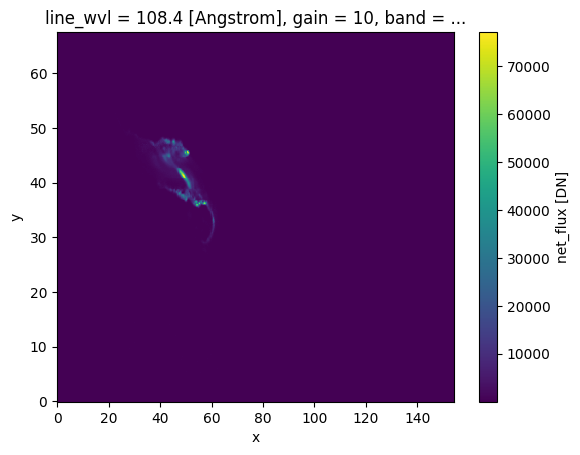

In [31]:
mom_slit_only_core.net_flux.isel(line=2).plot()

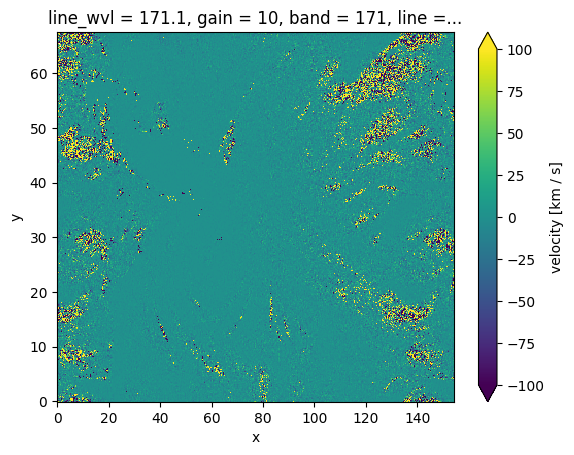

In [32]:
(mom_diff_removed-mom_only_core).velocity.isel(line=0).plot(vmin=-1e2, vmax=1e2)

(array([1.00000e+02, 1.19000e+02, 1.60000e+02, 2.16000e+02, 3.37000e+02,
        5.39000e+02, 1.03700e+03, 2.80000e+03, 2.54890e+04, 4.15694e+05,
        1.44060e+04, 2.16500e+03, 8.30000e+02, 5.03000e+02, 3.07000e+02,
        2.17000e+02, 1.68000e+02, 1.35000e+02, 9.00000e+01]),
 array([-950., -850., -750., -650., -550., -450., -350., -250., -150.,
         -50.,   50.,  150.,  250.,  350.,  450.,  550.,  650.,  750.,
         850.,  950.]),
 <BarContainer object of 19 artists>)

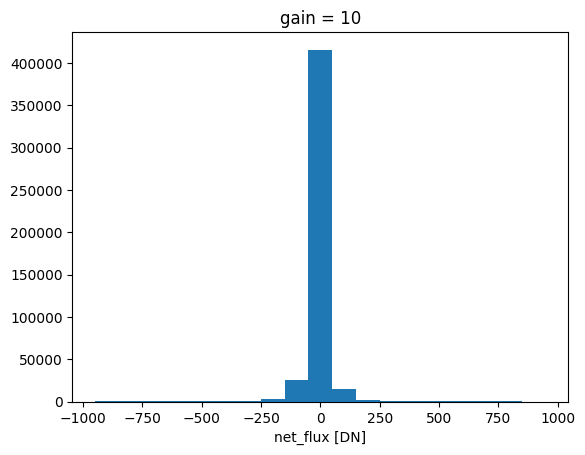

In [33]:
(mom_diff_removed-mom_only_core).net_flux.plot.hist(bins=np.arange(-950, 1050, 100))

In [34]:
from muse.synthesis.synthesis import calc_error
noise0 = calc_error(specsum_diff).error
scaling = noise0.max()/noise0
vdem_inv = vdem_solve(
    specsum_diff,
    respsum, 
    model=model,
    scaling = scaling, 
    serial = True,
)
vdem_inv.to_zarr(base_path+'/vdem_specsum_diff.zarr', mode='w')

2025-08-19 18:09:14.632 | INFO     | muse.inversions.inversions:vdem_solve:269 - updated shape of R: (4096, 98980)
2025-08-19 18:09:14.633 | INFO     | muse.inversions.inversions:vdem_solve:270 - updated shape of b: (4096, 4444)


100%|████████████████████████████████████| 4444/4444 [46:25:58<00:00, 37.61s/it]

2025-08-21 16:35:16.377 | INFO     | muse.inversions.inversions:vdem_solve:847 - Solve: units of spectrum: DN
2025-08-21 16:35:16.378 | INFO     | muse.inversions.inversions:vdem_solve:848 - Solve: units of response: 1e-27 cm5 DN / s
2025-08-21 16:35:16.380 | INFO     | muse.inversions.inversions:vdem_solve:857 - Solve: units of VDEM: 1e+27 s / cm5


In [35]:
from muse.synthesis.synthesis import calc_error
noise0 = calc_error(specsum_only_core).error
scaling = noise0.max()/noise0
vdem_inv = vdem_solve(
    specsum_only_core,
    respsum, 
    model=model,
    scaling = scaling, 
    serial = True,
)
vdem_inv.to_zarr(base_path+'/vdem_specsum_only_core.zarr', mode='w')

2025-08-21 16:35:25.196 | INFO     | muse.inversions.inversions:vdem_solve:269 - updated shape of R: (4096, 98980)
2025-08-21 16:35:25.197 | INFO     | muse.inversions.inversions:vdem_solve:270 - updated shape of b: (4096, 4444)


100%|████████████████████████████████████| 4444/4444 [44:11:33<00:00, 35.80s/it]

2025-08-23 12:47:03.330 | INFO     | muse.inversions.inversions:vdem_solve:847 - Solve: units of spectrum: DN
2025-08-23 12:47:03.331 | INFO     | muse.inversions.inversions:vdem_solve:848 - Solve: units of response: 1e-27 cm5 DN / s
2025-08-23 12:47:03.334 | INFO     | muse.inversions.inversions:vdem_solve:857 - Solve: units of VDEM: 1e+27 s / cm5


In [36]:
from muse.synthesis.synthesis import calc_error
noise0 = calc_error(spec_diff_removed).error
scaling = noise0.max()/noise0
vdem_inv = vdem_solve(
    spec_diff_removed,
    respsum, 
    model=model,
    scaling = scaling, 
    serial = True,
)
vdem_inv.to_zarr(base_path+'/vdem_spec_diff_removed.zarr', mode='w')

2025-08-23 12:47:11.650 | INFO     | muse.inversions.inversions:vdem_solve:269 - updated shape of R: (4096, 98980)
2025-08-23 12:47:11.650 | INFO     | muse.inversions.inversions:vdem_solve:270 - updated shape of b: (4096, 4444)


100%|████████████████████████████████████| 4444/4444 [50:02:51<00:00, 40.54s/it]

2025-08-25 14:50:06.501 | INFO     | muse.inversions.inversions:vdem_solve:847 - Solve: units of spectrum: DN
2025-08-25 14:50:06.502 | INFO     | muse.inversions.inversions:vdem_solve:848 - Solve: units of response: 1e-27 cm5 DN / s
2025-08-25 14:50:06.504 | INFO     | muse.inversions.inversions:vdem_solve:857 - Solve: units of VDEM: 1e+27 s / cm5


In [37]:
vdem_diff_inv = xr.open_zarr(base_path+'/vdem_specsum_diff.zarr').compute()
spec_diff_inv = vdem_synthesis(vdem_diff_inv, response, sum_over=["logT", "vdop"])
spec_diff_inv = exposure_time(spec_diff_inv, exp_time)
# spec_diff_inv = ph2dn(spec_diff_inv, response) 
spec_diff_inv['flux'].attrs['exp_time'] = exp_time
spec_diff_sub_cont = sub_contaminants(specsum_diff, spec_diff_inv)
mom_diff_inv = gaussian_fitting_analysis(
    spec_diff_inv,
    response,
    line_channel_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_diff_inv.to_zarr(base_path+'/mom_diff_inv', mode='w')

mom_diff_sub_cont = gaussian_fitting_analysis(
    spec_diff_sub_cont,
    response,
    line_channel_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range, 
                "velocity_array": mom_diff_inv["velocity"],
                "serial": serial_gfat})
mom_diff_sub_cont.to_zarr(base_path+'/mom_diff_sub_cont', mode='w')

2025-08-25 14:50:39.711 | INFO     | muse.synthesis.synthesis:exposure_time:773 - Exposure time has been previously applied.


/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/opti

In [38]:
vdem_only_core_inv = xr.open_zarr(base_path+'/vdem_specsum_only_core.zarr').compute()
spec_only_core_inv = vdem_synthesis(vdem_only_core_inv, response, sum_over=["logT", "vdop"])
spec_only_core_inv = exposure_time(spec_only_core_inv, exp_time)
# spec_only_core_inv = ph2dn(spec_only_core_inv, response) 
spec_only_core_inv['flux'].attrs['exp_time'] = exp_time
spec_only_core_sub_cont = sub_contaminants(specsum_only_core, spec_only_core_inv)
mom_only_core_inv = gaussian_fitting_analysis(
    spec_only_core_inv,
    response,
    line_channel_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_only_core_inv.to_zarr(base_path+'/mom_only_core_inv', mode='w')

mom_only_core_sub_cont = gaussian_fitting_analysis(
    spec_only_core_sub_cont,
    response,
    line_channel_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range, 
                "velocity_array": mom_only_core_inv["velocity"],
                "serial": serial_gfat})
mom_only_core_sub_cont.to_zarr(base_path+'/mom_only_core_sub_cont', mode='w')

2025-08-25 14:56:00.251 | INFO     | muse.synthesis.synthesis:exposure_time:773 - Exposure time has been previously applied.


/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/opti

In [39]:
vdem_diff_removed_inv = xr.open_zarr(base_path+'/vdem_spec_diff_removed.zarr').compute()
spec_diff_removed_inv = vdem_synthesis(vdem_diff_removed_inv, response, sum_over=["logT", "vdop"])
spec_diff_removed_inv = exposure_time(spec_diff_removed_inv, exp_time)
# spec_diff_removed_inv = ph2dn(spec_diff_removed_inv, response) 
spec_diff_removed_inv['flux'].attrs['exp_time'] = exp_time
spec_diff_removed_sub_cont = sub_contaminants(spec_diff_removed, spec_diff_removed_inv)
mom_diff_removed_inv = gaussian_fitting_analysis(
    spec_diff_removed_inv,
    response,
    line_channel_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_diff_removed_inv.to_zarr(base_path+'/mom_diff_removed_inv', mode='w')

mom_diff_removed_sub_cont = gaussian_fitting_analysis(
    spec_diff_removed_sub_cont,
    response,
    line_channel_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range, 
                "velocity_array": mom_diff_removed_inv["velocity"],
                "serial": serial_gfat})
mom_diff_removed_sub_cont.to_zarr(base_path+'/mom_diff_removed_sub_cont', mode='w')

2025-08-25 15:01:04.254 | INFO     | muse.synthesis.synthesis:exposure_time:773 - Exposure time has been previously applied.


/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/opti

In [21]:
from datetime import datetime
from dateutil.tz import gettz
from pathlib import Path
import json

def serialize_model(model):
    """
    Serialize a model to a dictionary.

    Args:
        model (object): The model to be serialized.

    Returns
    -------
        dict: The serialized model.
    """
    if model is None:
        return None
    return {
        "class": model.__module__ + "." + model.__class__.__name__,
        "parameters": model.get_params(),
    }

def plot_from_moment(
    mom_gt, 
    mom_inv, 
    spec_obs, 
    spec_inv, 
    *,
    gt_title='',
    cont_title='', 
    model_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/",
    model_name="muse_vdem_m-flare-muram_los2_trac_565000.zarr",
    resp_path_sg="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_with_slits/",
    resp_path_ci="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_CI/",
    FeXIX_108_resp="respfunc_108_FeXIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    FeXXI_108_resp="respfunc_108_FeXXI_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    contam_108_resp="respfunc_108-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    FeIX_171_resp="respfunc_171_FeIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    contam_171_resp="respfunc_171-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    FeXV_284_resp="respfunc_284_FeXV_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    contam_284_resp="respfunc_284-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    ci_195_resp="respfunc_195_CI_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    syn_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/",
    effect_path="/Volumes/Space/MUSE_GCP/muse_response_function/effective_area/25_oct_2025/",
    effect_area_108="effective_area_channel_108_JMS_2024-10-31.zarr",
    effect_area_171="effective_area_channel_171_JMS_2024-10-31.zarr",
    effect_area_284="effective_area_channel_284_JMS_2024-10-31.zarr",
    obs_filename_ci=None,
    obs_filename_sg=None,
    gt_filename_sg=None,
    serial_gfat=False,
    run_SDC=True,
    serial_SDC=True,
    run_mask=None,  # ["gt_vdem", "redundant", "intensity", "data_driven"]
    redundant_mask=None,
    velbin_inv=None,
    tgbin_inv=None,
    ntgbin_inv=None,
    rotate=False,
    saturation=None,
    KEYS=None,  # [None,"middle","bottom", "all"]
    target=None,  # ["QS","AR","FL"]
    jump_pix=None,  # [10,10] Jump in y-axis and t-step
    logT=None,
    vdop=None,
    logT_inv=None,
    vdop_inv=None,
    nslits=35,
    model=None,
    model2=None,
    data_driven_mask_model=None,
    data_driven_mask_keyword=None,
    exp_time=exp_time,
    noise=False,
    noise_seed=123456789,
    readoutnoise=2.24,
    compression: int = 1,
    npix=2,
    max_vel=50,
    velocity_range=50,
    velocity_range_gt=400,
    velocity_range_guided=None,
    intensity_scaling=None,  # ["noise", "no_noise", None]
    response_info="0.390/0.780 A",
    line=['Fe IX', 'Fe XV', 'Fe XIX 108.355'], 
    savefigs=True,
    savepath="./",
    save_id="",
    savelogfile="sdc_benchmark.json",
    logger=logger,
    save_output=False,
    save_output_netcdf=False,
    author="JMS",
    appendlog=None,
    disable_pbar=False,
    run_cont_id=False,
    dens_eff=1e9,  # The VDEM could be expanded to include density dependence (and the response function)
    pres_eff=3e15,  # The VDEM could be expanded to include density dependence (and the response function)
    lgtgmin_eff=4.8,
    int_cont_ratio=1e2,
    main_lines_cont=None,
    n_cont_top=20,
    cuda_device=3,
    pad_value=3,
    response_scaling=None,  # "auto", None
    unmask_outliers=True,
    randomizeSVD=True,
    muse_fov_mode="wrap",
    thresholds_ph=None,
    thresholds_dn=None,
    passchannels_to_solve=None,
):

    logfile = {}
    logfile["model"] = serialize_model(model)    

    
    mask_gt = masker("auto", mom_gt, line_channel_list=line, 
                     thresholds_ph=thresholds_ph, thresholds_dn=thresholds_dn)
    mask_inv = masker(
        "auto", mom_inv, line_channel_list=line, thresholds_ph=thresholds_ph, 
        thresholds_dn=thresholds_dn)
    mask_all = xr.where(mask_inv == 1, mask_inv, mask_gt)
    outliers = get_outliers_newer(mom_inv, mom_gt, line_channel_list=line, mask=mask_all, factor_int=4)
    # pdb.set_trace()
    sigma = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all)
    kargs = {"percentile": 95}
    sigma2 = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all, **kargs)
    kargs = {"percentile": 99.7}
    sigma3 = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all, **kargs)
    full_mask = mask_all.net_flux.sum("line", skipna=True)
    full_mask = xr.where(full_mask > 0, 1, 0)
    outs_full = 0
    for li in line:
        outs_full = outs_full + outliers[li]["velocity"]["values"] + outliers[li]["linewidth"]["values"]
    outs_full = xr.where(outs_full > 0, 1, 0)
    frac_full = 100 * outs_full.sum(dim=["x", "y"]).values / full_mask.sum(dim=["x", "y"]).values
    logfile[f"Outliers__frac"] = frac_full
    
    WEST = gettz("US/Western")
    reapname = f"{FeXIX_108_resp[19:-20]}"
    
    # plotting
    suptitle_string = {}
    modelname = model_name.split("/")[-1][:-5] if model_name is not None else obs_filename_sg.split("/")[-1][:-5]
    
    # Make modelname shorter (or will be too long for the filename):
    model_parts = modelname.split("_")
    reap_parts = reapname.split("_")
    unique_model_parts = [part for part in model_parts if part not in reap_parts]
    modelname = "_".join(unique_model_parts)
    # spec_inv_muse = sum_lines_slits_per_channel(spec_inv)
    spec_inv_muse = spec_inv.sum('slit')
    if 'line' in spec_inv_muse.dims:
        spec_inv_muse = spec_inv_muse.sum('line')
    Chi_error_ystep = np.abs(spec_inv_muse.flux - spec_obs.flux).sum(dim=["y", "SG_xpixel", "step"])
    for li in line:
        out_mu_sigma = outliers[li]["velocity"]["values"] + outliers[li]["linewidth"]["values"]
        out_mu_sigma = xr.where(out_mu_sigma > 0, 1, 0)
        frac = (
            100
            * out_mu_sigma.sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        logfile[f"Outliers__frac_{li}"] = frac
        logfile[f"outliers__frac_{li}_net_flux"] = (
            100
            * outliers[li]["net_flux"]["values"].sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        logfile[f"outliers__frac_{li}_velocity"] = (
            100
            * outliers[li]["velocity"]["values"].sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        logfile[f"outliers__frac_{li}_linewidth"] = (
            100
            * outliers[li]["linewidth"]["values"].sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        for ivars in ["net_flux", "velocity", "linewidth"]:
            logfile[f"sigma1__frac_{li}_{ivars}"] = sigma[li][ivars]
            logfile[f"sigma2__frac_{li}_{ivars}"] = sigma2[li][ivars]
            logfile[f"sigma3__frac_{li}_{ivars}"] = sigma3[li][ivars]
        kchannel = mom_inv.channel.sel(line=li)
        if run_SDC:
            suptitle_string[li] = (
                f"{logfile['model']['class'].split('.')[-1]}, {logfile['model']['parameters']['alpha']:.1e}, {logfile['model']['parameters']['fit_intercept']}, Abs. error {Chi_error_ystep.sel(channel=kchannel).data:.2e} \n GFAT-sub, {velocity_range} km/s; Out[{li}]%: {frac:.2f}, Out[all]%: {frac_full:.2f}"
            )
        else:
            suptitle_string[li] = (
                f"\n GFAT-sub, {velocity_range} km/s; Out[{li}]%: {frac:.2f}, Out[all]%: {frac_full:.2f}"
            )
    plot_with_chisquare(
        mom_inv,
        mom_gt,
        line,
        mask_obs=mask_inv,
        mask_gt=mask_gt,
        mask_all=mask_all,
        response=response_info,
        xaxis_gt=True,
        max_vel=max_vel,
        min_vel=-max_vel,
        suptitle_string=suptitle_string,
        save_id=f"GFAT_sub_{save_id}_GTnoise_{exp_time}sec__{modelname}_{reapname}_{author}_{datetime.now(WEST).date()!s}",
        savepath=savepath,
        outliers=outliers,
        cont_title=cont_title,
        gt_title=gt_title,
        sigmas=[sigma, sigma2, sigma3],
    )
    
    with (Path(savepath) / savelogfile).open("w") as fp:
        keys_to_remove = []
        for key in logfile:
            try:
                json.dumps(logfile[key])
            except (TypeError, OverflowError):
                logger.info(f"Key: {key} is not JSON serializable and will be removed from the logfile")
                keys_to_remove.append(key)
        for key in keys_to_remove:
            logfile.pop(key)
        json.dump(logfile, fp, indent=4)

In [22]:
diff_str = ['diff', 'diff_removed', 'only_core']
inv_str = ['']
spec1_str = ['sum_diff', '_diff_removed', 'sum_only_core']

In [24]:
from muse.variables import CENTROID_UNCERT_PROMISED, NPHOT_THRESHOLD, NDN_THRESHOLD
import copy 

new_dn_thres = copy.copy(NDN_THRESHOLD)
fold = 1
for i in new_dn_thres.keys():
    new_dn_thres[i] = new_dn_thres[i]*fold
    
mom_obs = []
spec1 = []
spec2 = []
savepath = []
save_id = []
for i in range(len(diff_str)): # diff
    for j in range(len(inv_str)): # inv
        mom_obs.append(f'mom_{diff_str[i]}{inv_str[j]}')
        spec1.append(f'spec{spec1_str[i]}')
        spec2.append(f'spec_slit_only_core_no_noise' if j == 0 else f'spec_{diff_str[i]}_inv')
        savepath.append(f'{base_path}/plot_thres{fold}/{diff_str[i]}{inv_str[j]}')
        save_id.append(f'{diff_str[i]}{inv_str[j]}')

for i in range(len(mom_obs)):
    plot_from_moment(mom_slit_only_core_no_noise, 
                     globals()[mom_obs[i]], 
                     globals()[spec1[i]], 
                     globals()[spec2[i]], 
                     savepath = savepath[i],
                     save_id = save_id[i],
                     cont_title = save_id[i],
                     gt_title = "No noise only core",
                     model = model, 
                     thresholds_dn = new_dn_thres) 

2025-09-08 16:15:44.562 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:611 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test4/plot_thres1/diff/FeIX_map_GFAT_sub_diff_GTnoise_1.0sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-09-08.png
2025-09-08 16:15:57.575 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:611 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test4/plot_thres1/diff/FeXV_map_GFAT_sub_diff_GTnoise_1.0sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-09-08.png
2025-09-08 16:16:10.643 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:611 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test4/plot_thres1/diff/FeXIX108.355_map_GFAT_sub_diff_GTnoise_1.0sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-09-08.png
2025-09-08 16:16:39.890 | INF

In [210]:
plot_from_moment(
    mom_slit_only_core_no_noise, 
    mom_diff, 
    specsum_diff, 
    spec_slit_only_core_no_noise, 
    savepath = base_path+'/plot_diff', 
    save_id = 'diff',  
    cont_title = 'diff', 
    gt_title = "No noise only core",
    model = model) 


2025-08-29 13:53:58.567 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff/FeIX_map_GFAT_sub_diff_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:54:11.970 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff/FeXV_map_GFAT_sub_diff_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:54:25.353 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff/FeXIX108.355_map_GFAT_sub_diff_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png


In [211]:
plot_from_moment(
    mom_slit_only_core_no_noise, 
    mom_diff_inv, 
    specsum_diff, 
    spec_diff_inv, 
    savepath = base_path+'/plot_diff_inv', 
    save_id = 'diff_inv',  
    cont_title = 'diff inv', 
    gt_title = "No noise only core",
    model = model) 


2025-08-29 13:55:04.944 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_inv/FeIX_map_GFAT_sub_diff_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:55:17.997 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_inv/FeXV_map_GFAT_sub_diff_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:55:31.058 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_inv/FeXIX108.355_map_GFAT_sub_diff_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png


In [212]:
plot_from_moment(
    mom_slit_only_core_no_noise, 
    mom_diff_sub_cont, 
    specsum_diff, 
    spec_diff_inv, 
    savepath = base_path+'/plot_diff_inv_sub_cont', 
    save_id = 'diff_inv_sub_cont',  
    cont_title = 'diff inv sub_cont', 
    gt_title = "No noise only core",
    model = model) 


2025-08-29 13:56:07.986 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_inv_sub_cont/FeIX_map_GFAT_sub_diff_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:56:20.959 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_inv_sub_cont/FeXV_map_GFAT_sub_diff_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:56:34.502 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_inv_sub_cont/FeXIX108.355_map_GFAT_sub_diff_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coati

In [213]:
plot_from_moment(
    mom_slit_only_core_no_noise, 
    mom_only_core, 
    specsum_only_core, 
    spec_slit_only_core_no_noise, 
    savepath = base_path+'/plot_only_core', 
    save_id = 'only_core',  
    cont_title = 'only core', 
    gt_title = "No noise only core",
    model = model) 


2025-08-29 13:57:06.520 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_only_core/FeIX_map_GFAT_sub_only_core_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:57:19.594 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_only_core/FeXV_map_GFAT_sub_only_core_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:57:32.797 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_only_core/FeXIX108.355_map_GFAT_sub_only_core_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png


In [214]:
plot_from_moment(
    mom_slit_only_core_no_noise, 
    mom_only_core_inv, 
    specsum_only_core, 
    spec_only_core_inv, 
    savepath = base_path+'/plot_only_core_inv', 
    save_id = 'only_core_inv',  
    cont_title = 'only core inv', 
    gt_title = "No noise only core",
    model = model) 


2025-08-29 13:58:10.928 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_only_core_inv/FeIX_map_GFAT_sub_only_core_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:58:23.781 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_only_core_inv/FeXV_map_GFAT_sub_only_core_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:58:36.812 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_only_core_inv/FeXIX108.355_map_GFAT_sub_only_core_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.

In [215]:
plot_from_moment(
    mom_slit_only_core_no_noise, 
    mom_only_core_sub_cont, 
    specsum_only_core, 
    spec_only_core_inv, 
    savepath = base_path+'/plot_only_core_inv_sub_cont', 
    save_id = 'only_core_inv_sub_cont',  
    cont_title = 'only_core inv sub_cont', 
    gt_title = "No noise only core",
    model = model) 


2025-08-29 13:59:13.418 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_only_core_inv_sub_cont/FeIX_map_GFAT_sub_only_core_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:59:26.377 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_only_core_inv_sub_cont/FeXV_map_GFAT_sub_only_core_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 13:59:39.223 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_only_core_inv_sub_cont/FeXIX108.355_map_GFAT_sub_only_core_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep

In [216]:
plot_from_moment(
    mom_slit_only_core_no_noise, 
    mom_diff_removed, 
    spec_diff_removed, 
    spec_slit_only_core_no_noise, 
    savepath = base_path+'/plot_diff_removed', 
    save_id = 'diff_removed',  
    cont_title = 'diff removed', 
    gt_title = "No noise only core",
    model = model) 


2025-08-29 14:00:14.465 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_removed/FeIX_map_GFAT_sub_diff_removed_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 14:00:27.961 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_removed/FeXV_map_GFAT_sub_diff_removed_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 14:00:40.864 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_removed/FeXIX108.355_map_GFAT_sub_diff_removed_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png


In [217]:
plot_from_moment(
    mom_slit_only_core_no_noise, 
    mom_diff_removed_inv, 
    spec_diff_removed, 
    spec_diff_removed_inv, 
    savepath = base_path+'/plot_diff_removed_inv', 
    save_id = 'diff_removed_inv',  
    cont_title = 'diff removed inv', 
    gt_title = "No noise only core",
    model = model) 


2025-08-29 14:01:19.764 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_removed_inv/FeIX_map_GFAT_sub_diff_removed_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 14:01:32.802 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_removed_inv/FeXV_map_GFAT_sub_diff_removed_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 14:01:45.765 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_removed_inv/FeXIX108.355_map_GFAT_sub_diff_removed_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOpti

In [218]:
plot_from_moment(
    mom_slit_only_core_no_noise, 
    mom_diff_removed_sub_cont, 
    spec_diff_removed, 
    spec_diff_removed_inv, 
    savepath = base_path+'/plot_diff_removed_inv_sub_cont', 
    save_id = 'diff_removed_inv_sub_cont',  
    cont_title = 'diff removed inv sub cont', 
    gt_title = "No noise only core",
    model = model) 


2025-08-29 14:02:22.094 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_removed_inv_sub_cont/FeIX_map_GFAT_sub_diff_removed_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 14:02:35.376 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_removed_inv_sub_cont/FeXV_map_GFAT_sub_diff_removed_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-29.png
2025-08-29 14:02:48.458 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test2/plot_diff_removed_inv_sub_cont/FeXIX108.355_map_GFAT_sub_diff_removed_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_5

In [30]:
line=['Fe IX', 'Fe XV', 'Fe XIX 108.355']
target_obj = mom_diff_removed
mask_gt = masker("auto", mom_slit_only_core, line_channel_list=line, 
                 thresholds_ph=None, thresholds_dn=None)
mask_inv = masker("auto", target_obj, line_channel_list=line, 
                  thresholds_ph=None, thresholds_dn=None)
mask_all = xr.where(mask_inv == 1, mask_inv, mask_gt)

13236 37576.0 0.35224611454119653


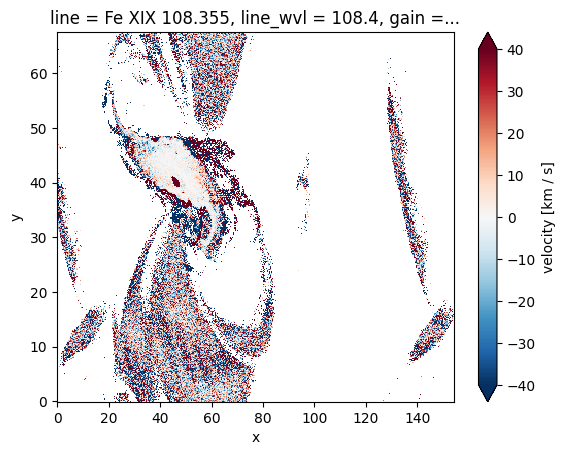

In [40]:
line_no = 2
aa = (target_obj*mask_all).sel(line=line[line_no])
bb = (mom_slit_only_core*mask_all).sel(line=line[line_no])

thres = 10 if line[line_no] != 'Fe XIX 108.355' else 30
n1 = (abs(bb-aa).velocity > thres).sum()
n2 = mask_all.velocity.sel(line=line[line_no]).sum()
print(n1.values, n2.values, (n1/n2).values)

((target_obj-mom_slit_only_core)*mask_all).velocity.sel(line=line[line_no]).plot(vmin=-40, vmax=40, cmap='RdBu_r')

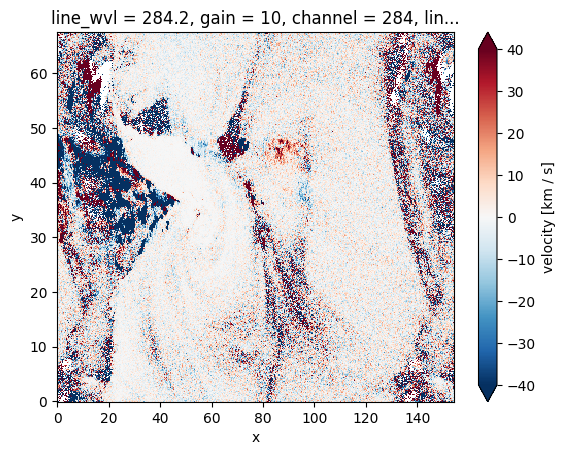

In [39]:
(target_obj-mom_slit_only_core).velocity.sel(line=line[line_no]).plot(vmin=-40, vmax=40, cmap='RdBu_r')

In [27]:
exp_time

1.0

In [61]:
line=['Fe IX', 'Fe XV', 'Fe XIX 108.355']
target_obj = mom_only_core_sub_cont
mask_gt = masker("auto", mom_slit_only_core, line_channel_list=line, 
                 thresholds_ph=None, thresholds_dn=None)
mask_inv = masker("auto", target_obj, line_channel_list=line, 
                  thresholds_ph=None, thresholds_dn=None)
mask_all = xr.where(mask_inv == 1, mask_inv, mask_gt)

2635 78225.0 0.03368488334931288


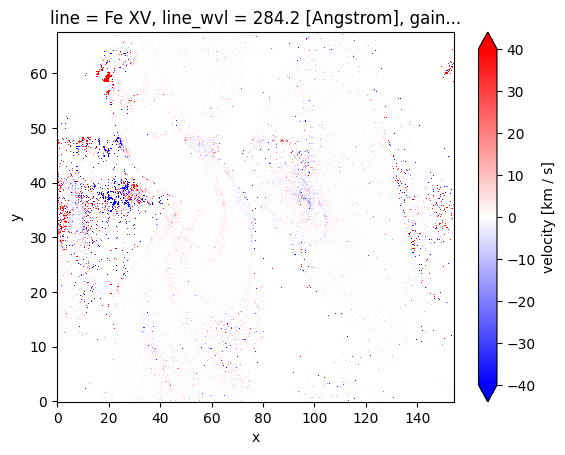

In [62]:
line = 1
aa = (target_obj*mask_all).isel(line=line)
bb = (mom_slit_only_core*mask_all).isel(line=line)

thres = 10 if line != 2 else 30
n1 = (abs(bb-aa).velocity > thres).sum()
n2 = mask_all.velocity.isel(line=line).sum()
print(n1.values, n2.values, (n1/n2).values)

((target_obj-mom_slit_only_core)*mask_all).velocity.isel(line=line).plot(vmin=-40, vmax=40, cmap='bwr')

5940 77714.0 0.07643410453714904


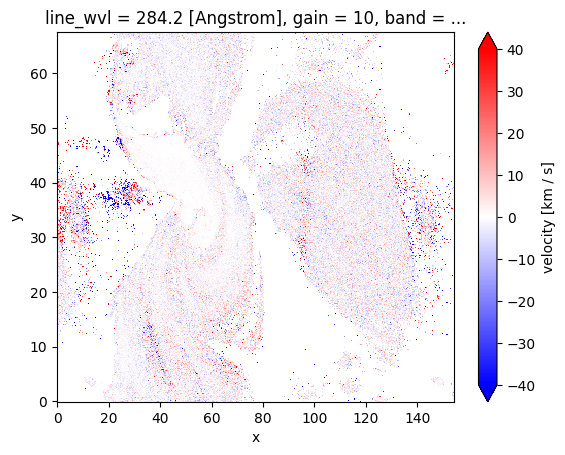

In [54]:
line = 1
aa = (target_obj*mask_all).isel(line=line)
bb = (mom_slit_only_core*mask_all).isel(line=line)

thres = 10 if line != 2 else 30
n1 = (abs(bb-aa).velocity > thres).sum()
n2 = mask_all.velocity.isel(line=line).sum()
print(n1.values, n2.values, (n1/n2).values)

((target_obj-mom_slit_only_core)*mask_all).velocity.isel(line=line).plot(vmin=-40, vmax=40, cmap='bwr')

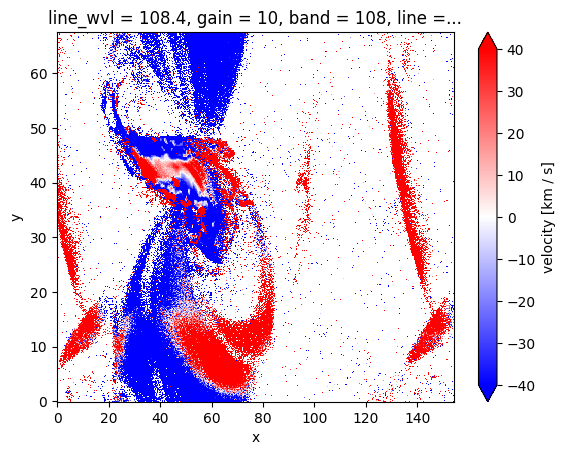

In [53]:
(mom_only_core*mask_all).velocity.isel(line=line).plot(vmin=-40, vmax=40, cmap='bwr')

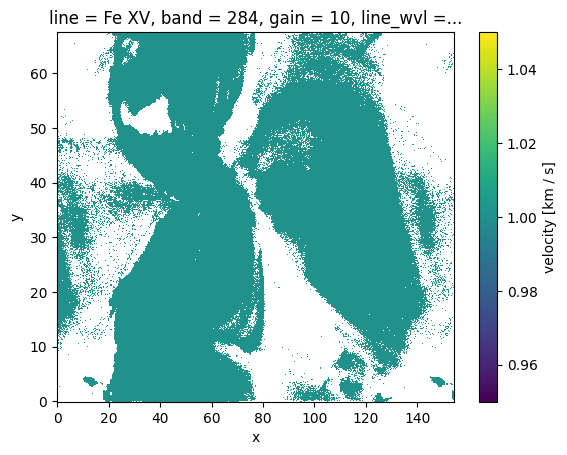

In [74]:
mask_inv.velocity.isel(line=1).plot()

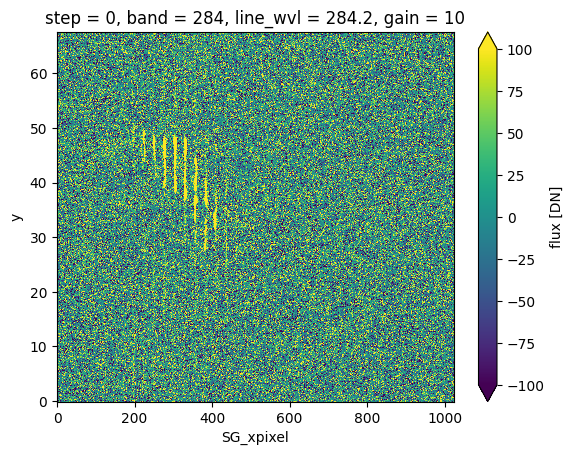

In [128]:
(specsum_diff-spec_slit_only_core.sum('slit')).flux.isel(channel=2, step=0).plot(vmin=-1e2, vmax=1e2)

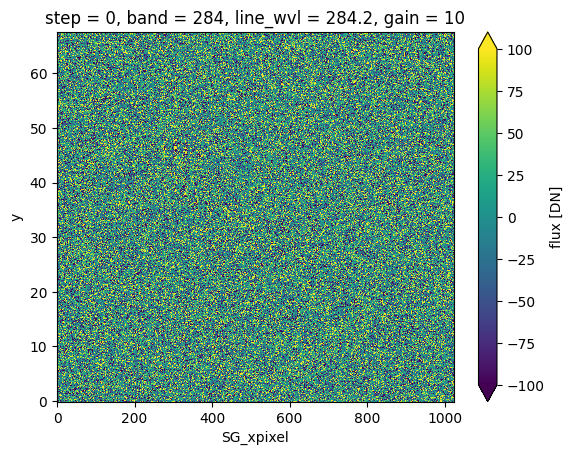

In [129]:
(spec_diff_removed-spec_slit_only_core.sum('slit')).flux.isel(channel=2, step=0).plot(vmin=-1e2, vmax=1e2)

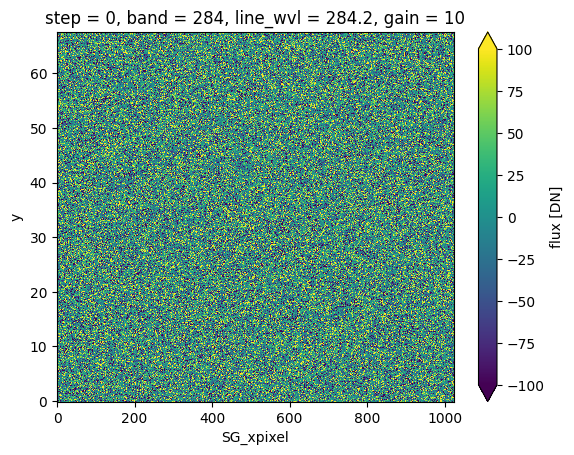

In [130]:
(specsum_only_core - spec_slit_only_core.sum('slit')).flux.isel(channel=2, step=0).plot(vmin=-1e2, vmax=1e2)

In [117]:
100//(0.4*11)

22.0

[(600.0, 700.0)]

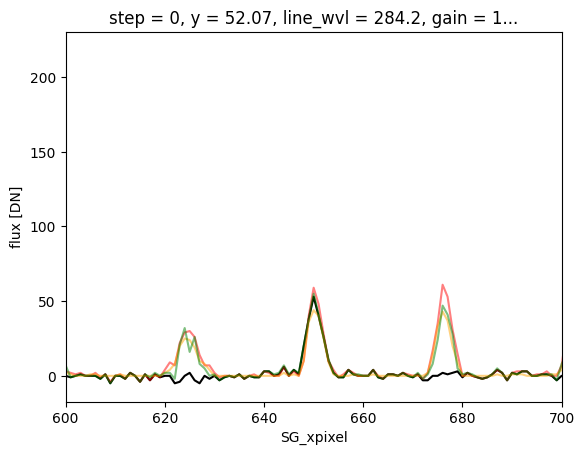

In [170]:
alpha = 0.5
y = 52
step=0
band = 284
line = ['Fe XV']
spec_slit_only_core.flux.sel(band=band, slit=23).sel(y=y, step=step, method='nearest').plot(c='k')
specsum_diff.flux.sel(y=y, step=step, method='nearest').sel(band=band).plot(c='r', alpha=alpha)
spec_diff_removed.flux.sel(y=y, step=step, method='nearest').sel(band=band).plot(c='orange', alpha=alpha)
specsum_only_core.flux.sel(y=y, step=step, method='nearest').sel(band=band).plot(c='g', alpha=alpha)
plt.gca().set(xlim=[600, 700])

In [150]:
def comp(target_gt, target_obj, line=['Fe XV']):
    mask_gt = masker("auto", target_gt, line_band_list=line, 
                     thresholds_ph=None, thresholds_dn=None)
    mask_inv = masker("auto", target_obj, line_band_list=line, 
                      thresholds_ph=None, thresholds_dn=None)
    mask_all = xr.where(mask_inv == 1, mask_inv, mask_gt)
    
    aa = (target_obj*mask_all).sel(line=line)
    bb = (target_gt*mask_all).sel(line=line)
    
    thres = 10 if line != 2 else 30
    n1 = (abs(bb-aa).velocity > thres).sum()
    n2 = mask_all.velocity.sel(line=line).sum()
    print(n1.values, n2.values, (n1/n2).values)
    
    ((target_obj-target_gt)*mask_all).velocity.sel(line=line).plot(vmin=-40, vmax=40, cmap='RdBu_r')
        

13561 100325.0 0.13517069524046849


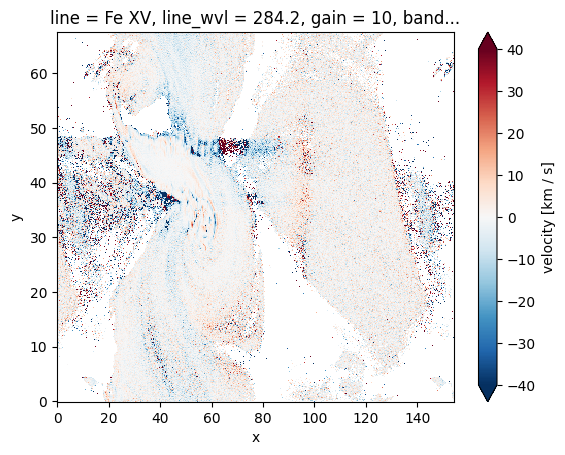

In [151]:
comp(mom_diff, mom_diff_removed)

6158 83082.0 0.07411954454635179


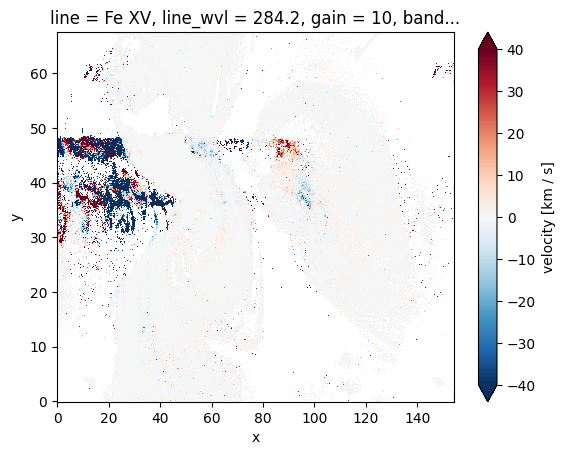

In [152]:
comp(mom_slit_only_core, mom_only_core)

21314 85436.0 0.24947328994803128


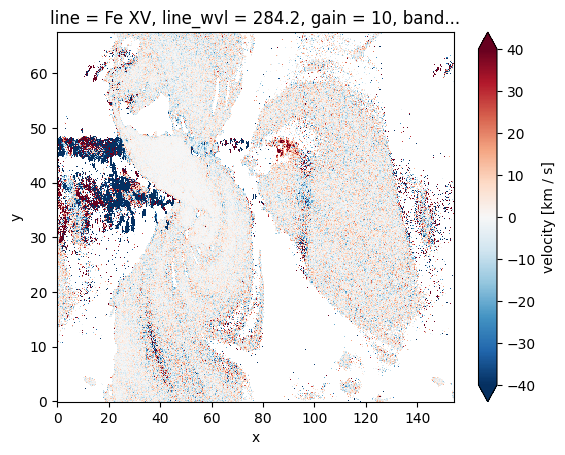

In [153]:
comp(mom_slit_only_core, mom_diff_removed)

32767 100839.0 0.32494372217098544


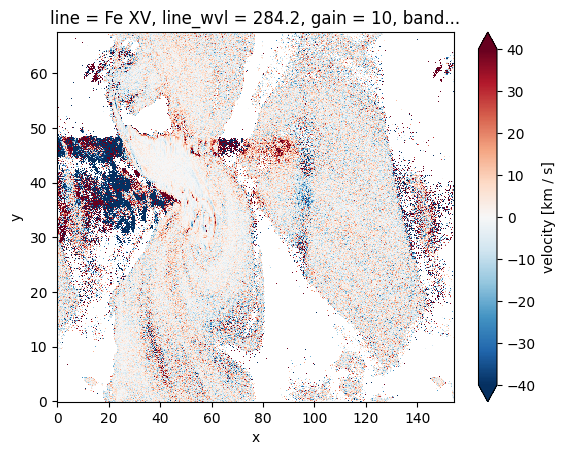

In [154]:
comp(mom_slit_only_core, mom_diff)

20983 85412.0 0.24566805601086497


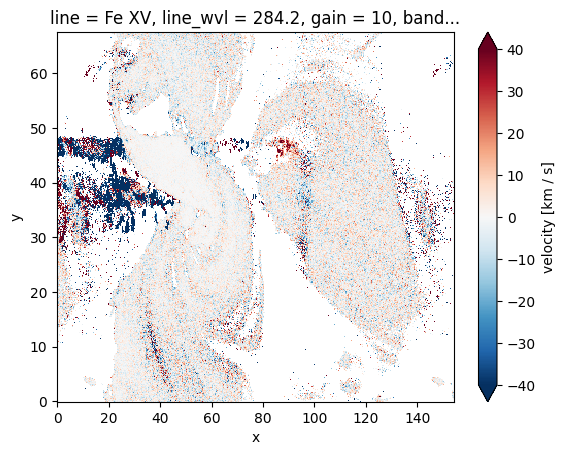

In [175]:
comp(mom_slit_only_core, mom_diff_removed)

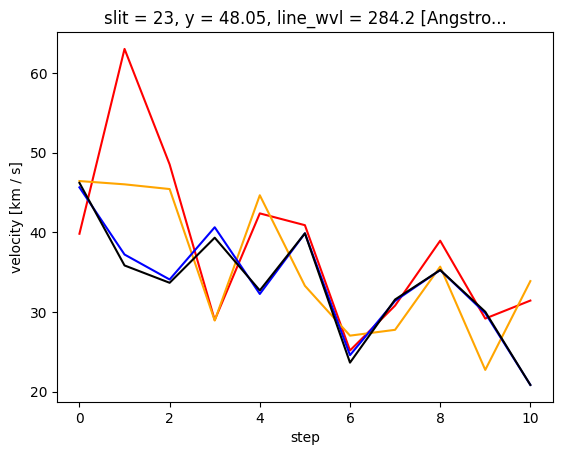

In [173]:
reshape_x2rs(mom_diff.velocity).sel(line=line).sel(y=y, slit=23, method='nearest').plot(c='r')
reshape_x2rs(mom_diff_removed.velocity).sel(line=line).sel(y=y, slit=23, method='nearest').plot(c='orange')
reshape_x2rs(mom_only_core.velocity).sel(line=line).sel(y=y, slit=23, method='nearest').plot(c='b')
reshape_x2rs(mom_slit_only_core.velocity).sel(line=line).sel(y=y, slit=23, method='nearest').plot(c='k')

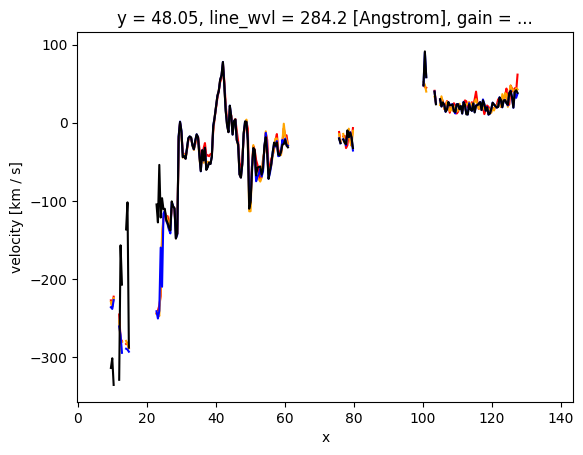

In [174]:
(mom_diff.velocity*mask_all.velocity).sel(line=line).sel(y=y, method='nearest').plot(c='r')
(mom_diff_removed.velocity*mask_all.velocity).sel(line=line).sel(y=y, method='nearest').plot(c='orange')
(mom_only_core.velocity*mask_all.velocity).sel(line=line).sel(y=y, method='nearest').plot(c='b')
(mom_slit_only_core.velocity*mask_all.velocity).sel(line=line).sel(y=y, method='nearest').plot(c='k')

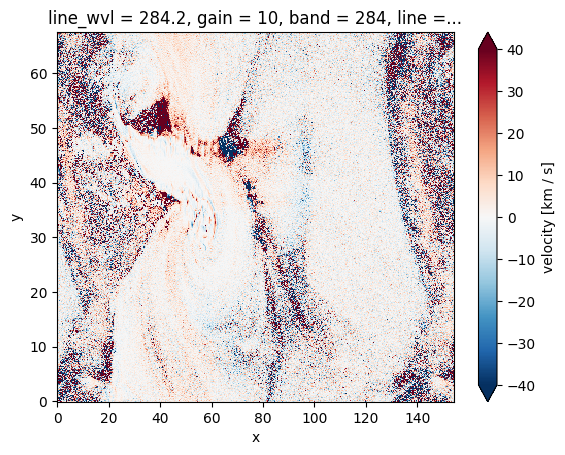

In [140]:
(mom_diff.velocity - mom_diff_removed.velocity).sel(line=line).plot(vmin=-40, vmax=40, cmap='RdBu_r')

In [ ]:
(mom_diff.velocity - mom_diff_removed.velocity).sel(line=line).plot(vmin=-40, vmax=40, cmap='RdBu_r')

In [135]:
mom_slit_only_core.velocity.isel(line=2)

<xarray.Dataset>
Dimensions:          (y: 404, SG_xpixel: 1024, line: 3, x: 385)
Coordinates:
  * y                (y) float64 0.0 0.1674 0.3348 0.5022 ... 67.13 67.3 67.47
  * SG_xpixel        (SG_xpixel) int64 0 1 2 3 4 5 ... 1019 1020 1021 1022 1023
    line_wvl         (line) float64 171.1 284.2 108.4
    gain             int64 10
    band             (line) int64 171 284 108
  * line             (line) <U23 'Fe IX' 'Fe XV' 'Fe XIX 108.355'
  * x                (x) float64 0.0 0.401 0.8021 1.203 ... 153.2 153.6 154.0
Data variables:
    amplitude        (line, y, x) float64 5.4 7.2 5.4 6.3 ... 5.4 5.4 5.4 5.4
    velocity         (line, y, x) float64 370.5 -398.5 ... -2.792e+04 -2.738e+04
    linewidth        (line, y, x) float64 68.48 34.0 34.0 ... 61.37 61.37 61.37
    net_flux         (line, y, x) float64 35.98 23.82 17.86 ... 20.42 20.42
    error_amplitude  (line, y, x) float64 3.896 4.02 3.14 ... 4.46 4.292 2.712
    error_velocity   (line, y, x) float64 201.2 24.85 22.78 ... 63.85 61.29
    error_linewidth  (line, y, x) float64 160.0 28.58 25.25 ... 71.77 76.1 63.65
    error_net_flux   (line, y, x) float64 2.267e+03 619.1 ... 1.223e+03 957.2
    RedChisq         (line, y, x) float64 0.4647 0.3562 0.402 ... 0.8069 0.3294
    FLAGS            (line, y, x) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    GFIT_mask        (line, y, SG_xpixel, x) int64 0 0 0 0 0 0 0 ... 0 0 0 0 0 0
Attributes:
    Chianti version:  10.1
    HISTORY:          ['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=...
    abundance:        sun_coronal_2021_chianti
    date created:     06-Nov-2024
    date modified:    20-Aug-2025
    version:          0.2.dev6+g6505469
    step_size:        0.4010416666666667
    step_size units:  arcsec
    flux units:       ph/s

In [179]:
new_ci_resp = xr.open_zarr('/Users/khcho/MUSE/benchmark/respfunc_ci_195_sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JDP_2025-07-24.zarr').compute()

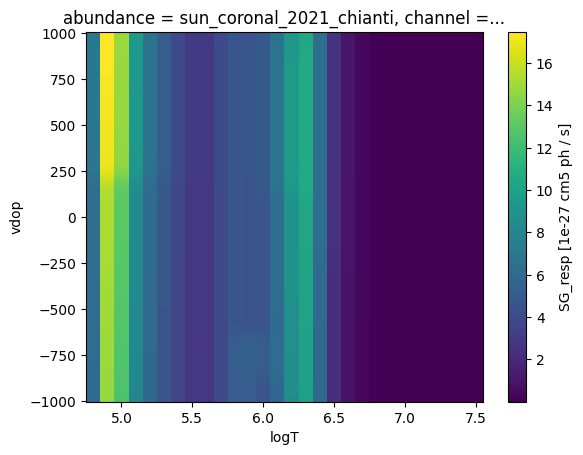

In [182]:
new_ci_resp.SG_resp.isel(line=0, pressure=0, abundance=0).plot()

In [74]:
spec_gt.flux.attrs

{'units': 'ph', 'exp_time': 0.6}

In [75]:
spec_gt_noise.flux.attrs

{'units': 'DN', 'exp_time': 0.6}

In [119]:
mom_slit_only_core.attrs['HISTORY']

['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=35, nraster=11, restype=match_res_tile, mode=wrap, sub_interpolation=2)',
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'reshape_rs2x(ds=ds, nslits=35, nraster=11)',
 "vdem_syn_join_slits_wvl(response=response, vdem=vdem, islits=(2, 32), sum_over=('logT', 'vdop'), band=(108, 171, 284), line=line, cuda_device=None)",
 "convolve_model_psf(spectrum=spectrum, model=<function gausslobes at 0x1ea6fbe20>, fixed_psf_per_channel=False, band=[108, 171, 284], inplace=False, kwargs={'oversample_x': 3, 'slit_dim': 404, 'lpi': 5, 'fwhm': 0.5, 'transmission': 0.97, 'only_core': [True, True, True]})",
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'muse_interp_xyw2rssg(spec=spec, response=response, band=band, line=line, method=cubic, kwargs={})',
 'exposure_time(spec=spec, exp_time=0.6)',
 'add_noise_poisson(spectra=spectra, response=response, seed=123456789)',
 'ph2dn(spec=spec, response=response)',
 'reshape_rs2x(ds=ds, nslits=35, nraster=11)

In [120]:
mom_only_core.attrs['HISTORY']

['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=35, nraster=11, restype=match_res_tile, mode=wrap, sub_interpolation=2)',
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'reshape_rs2x(ds=ds, nslits=35, nraster=11)',
 "vdem_syn_join_slits_wvl(response=response, vdem=vdem, islits=(2, 32), sum_over=('logT', 'vdop'), band=(108, 171, 284), line=line, cuda_device=None)",
 "convolve_model_psf(spectrum=spectrum, model=<function gausslobes at 0x1ea6fbe20>, fixed_psf_per_channel=False, band=[108, 171, 284], inplace=False, kwargs={'oversample_x': 3, 'slit_dim': 404, 'lpi': 5, 'fwhm': 0.5, 'transmission': 0.97, 'only_core': [True, True, True]})",
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'muse_interp_xyw2rssg(spec=spec, response=response, band=band, line=line, method=cubic, kwargs={})',
 'exposure_time(spec=spec, exp_time=0.6)',
 'add_noise_poisson(spectra=spectra, response=response, seed=123456789)',
 'sum_lines_slits_per_band(spec=spec)',
 'ph2dn(spec=spec, response=response)',
 'ad

In [121]:
mom_diff.attrs['HISTORY']

['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=35, nraster=11, restype=match_res_tile, mode=wrap, sub_interpolation=2)',
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'reshape_rs2x(ds=ds, nslits=35, nraster=11)',
 "vdem_syn_join_slits_wvl(response=response, vdem=vdem, islits=(2, 32), sum_over=('logT', 'vdop'), band=(108, 171, 284), line=line, cuda_device=None)",
 "convolve_model_psf(spectrum=spectrum, model=<function gausslobes at 0x1ea6fbe20>, fixed_psf_per_channel=False, band=[108, 171, 284], inplace=False, kwargs={'oversample_x': 3, 'slit_dim': 404, 'lpi': 5, 'fwhm': 0.5, 'transmission': 0.97})",
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'muse_interp_xyw2rssg(spec=spec, response=response, band=band, line=line, method=cubic, kwargs={})',
 'exposure_time(spec=spec, exp_time=0.6)',
 'add_noise_poisson(spectra=spectra, response=response, seed=123456789)',
 'sum_lines_slits_per_band(spec=spec)',
 'ph2dn(spec=spec, response=response)',
 'add_noise_readout(spectra=spectra, 

In [62]:
mom_slit_only_core.net_flux.isel(line=2).median()

<xarray.DataArray 'net_flux' ()>
array(23.82872661)
Coordinates:
    band      int64 108
    gain      int64 10
    line      <U14 'Fe XIX 108.355'
    line_wvl  float64 108.4
Attributes:
    exp_time:  0.6
    units:     DN

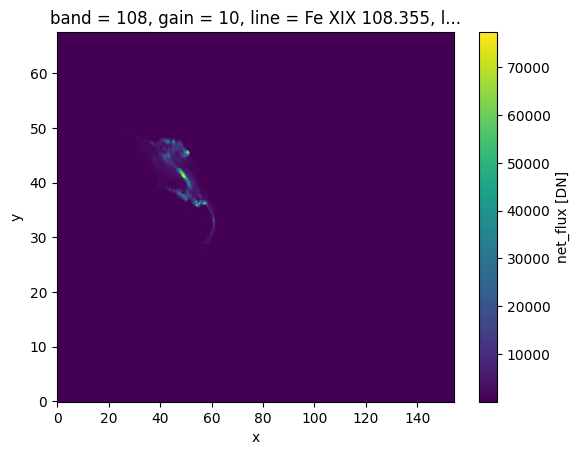

In [57]:
mom_slit_only_core.net_flux.isel(line=2).plot()

In [67]:
cen_sgx = np.abs(spec_merge_line.SG_wvl.sel(band=284) - spec_merge_line.line_wvl.sel(band=284)).argmin(dim='SG_xpixel')
aa = spec_merge_line.flux.sel(band=284, 
                         SG_xpixel=cen_sgx, 
                         method='nearest')


In [68]:
aa_core = spec_only_core.flux.sel(band=284, SG_xpixel=cen_sgx, method='nearest').transpose('y', 'x')

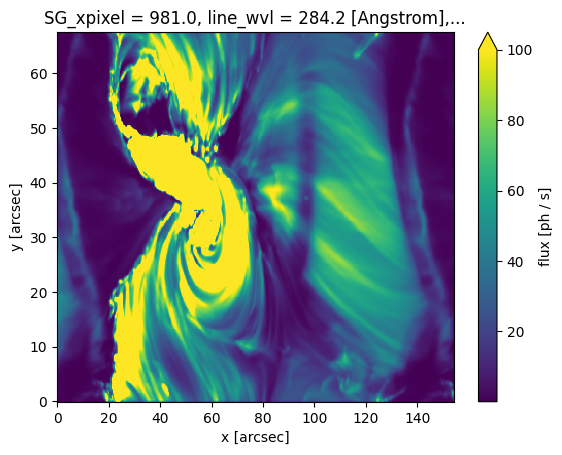

In [69]:
aa_core.plot(vmax=100)

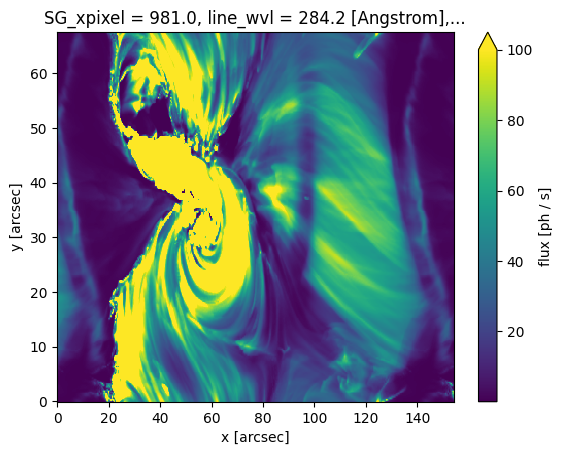

In [70]:
aa.plot(vmax=100)

In [71]:
from scipy.signal import fftconvolve, deconvolve
from scipy.fftpack import fftn, ifftn, fftshift, ifftshift
from importlib import reload
import muse.instr.mono_diffraction
reload(muse.instr.mono_diffraction)
from muse.instr.mono_diffraction import mono_image, diffraction_removal_in_2d, find_sgx_pixel_from_wavelength
import astropy.units as u

In [72]:
psf = gausslobes(wavelength=aa.line_wvl.item()*u.AA, **kargs).T
psf_core = gausslobes(wavelength=aa.line_wvl.item()*u.AA, **kargs, only_core=True).T
n_psf = psf / np.sum(psf)
# bbb = fftconvolve(aa, psf, mode='same')

In [73]:
ay, ax = aa.shape
psfy, psfx = psf.shape

In [75]:
aa0, psf0 = match_size(aa, psf)

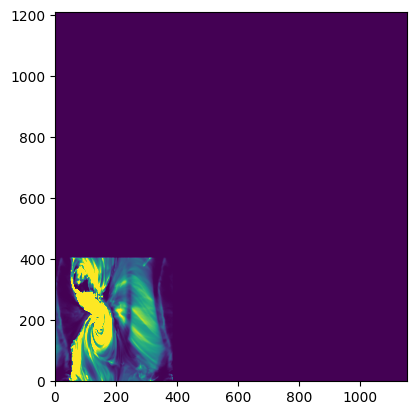

In [74]:
aa12 = np.zeros((ay+psfy-1, ax+psfx-1))
aa12[:ay, :ax] = aa
plt.imshow(aa12, vmax=100)

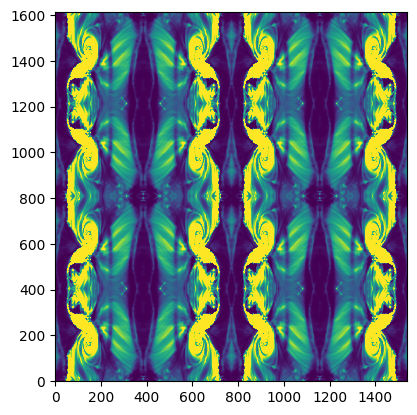

In [76]:
plt.imshow(aa0, vmax=100)

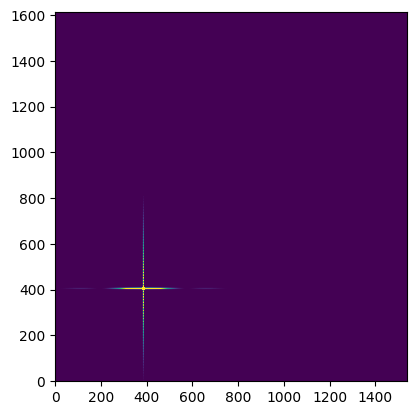

In [29]:
plt.imshow(psf0, vmax=1e-5)

In [30]:
# bb0 = np.real(ifftn(fftn(aa0)*fftn(psf0)))
bb = fftconv(aa, psf)
bb0 = fftconv(aa, psf, crop=False)

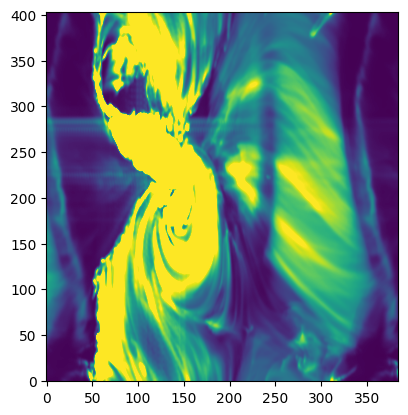

In [31]:
plt.imshow(bb, vmax=100)

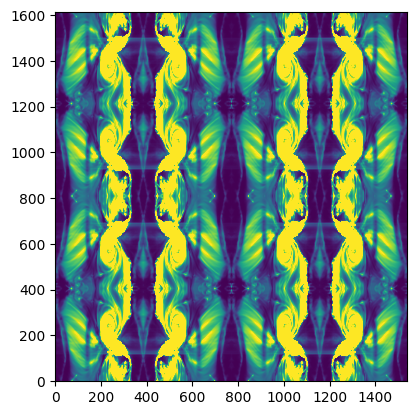

In [32]:
plt.imshow(bb0, vmax=100)

In [33]:
cc0 = np.real(np.fft.ifft2(np.fft.fft2(bb0)/np.fft.fft2(psf0)))

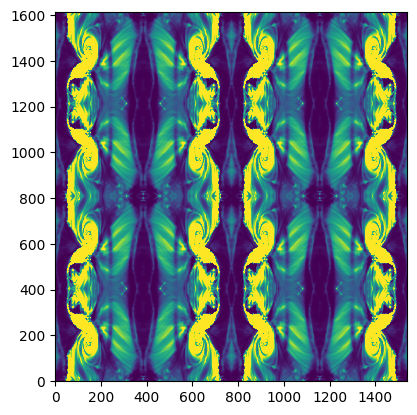

In [34]:
plt.imshow(cc0, vmax=100)

In [36]:
iter = 25
img_decon = np.copy(bb)
for _ in range(iter):
    ratio = bb / fftconv(img_decon,n_psf)
    img_decon = img_decon*fftconv(ratio, n_psf[::-1, ::-1])
cc = fftconv(img_decon/np.sum(psf), psf_core)    

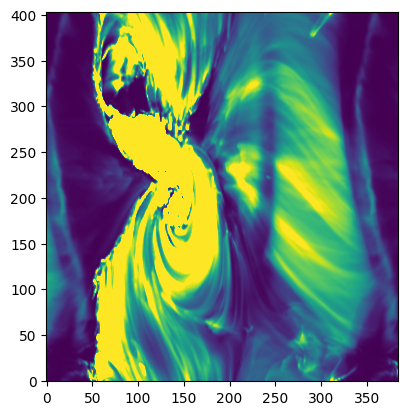

In [37]:
plt.imshow(img_decon, vmax=1e2, vmin=0)

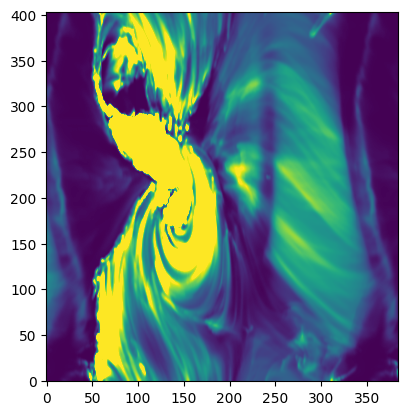

In [38]:
plt.imshow(cc, vmax=1e2, vmin=0)

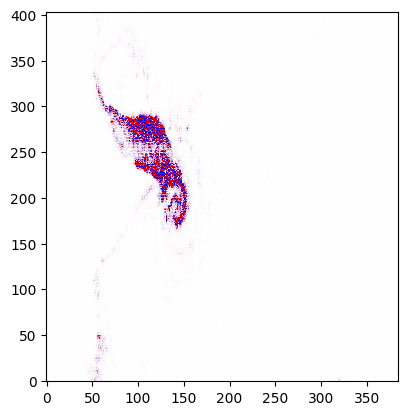

In [1120]:
plt.imshow(img_decon/np.sum(psf)-aa, vmin=-1e2, vmax=1e2, cmap='bwr')


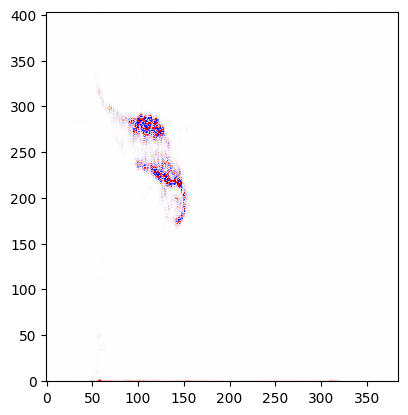

In [1131]:
plt.imshow(cc-aa_core, vmin=-1e2, vmax=1e2, cmap='bwr')


In [1076]:
iter = 25
psff = fftn(psf)
img_decon = np.copy(bb)
for _ in range(iter):
    ratio = bb / fftconvolve(img_decon, psf, mode='same')
    img_decon = img_decon*fftconvolve(ratio, psf[::-1, ::-1], mode='same')
cc = fftconvolve(img_decon, psf_core, mode='same')    

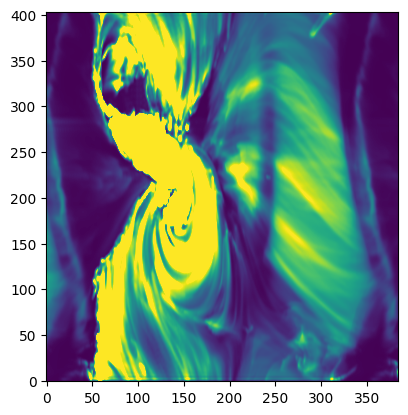

In [1077]:
plt.imshow(cc, vmax=1e2, vmin=0)

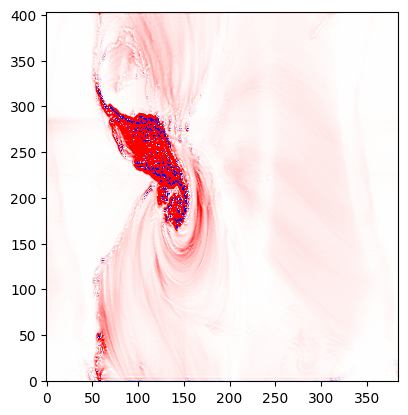

In [1078]:
plt.imshow(cc-aa, vmin=-1e2, vmax=1e2, cmap='bwr')

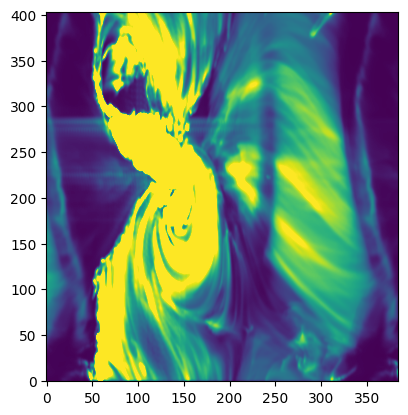

In [818]:
plt.imshow(bbb, vmax=100)

In [861]:
cc0 = np.real(ifftn(fftn(bb0)/fftn(psf0)))

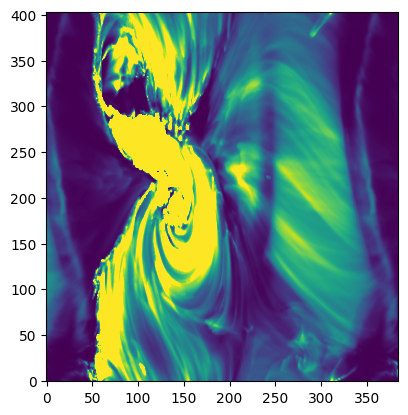

In [863]:
plt.imshow(cc0[:ay, :ax], vmin=0, vmax=100)

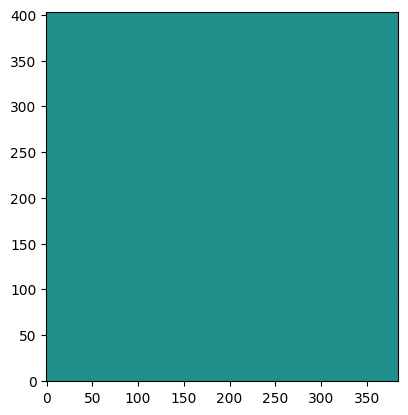

In [866]:
plt.imshow(cc0[:ay, :ax]-aa, vmin=-1e-5, vmax=1e-5)

In [95]:
spec_diff_removed_inv.swap_dims({'line':'band'}).sel(band=spec_diff_removed_inv.band[0])

<xarray.Dataset>
Dimensions:    (slit: 35, step: 11, y: 404, band: 3, SG_xpixel: 1024)
Coordinates:
  * slit       (slit) int64 0 1 2 3 4 5 6 7 8 9 ... 26 27 28 29 30 31 32 33 34
  * step       (step) int64 0 1 2 3 4 5 6 7 8 9 10
  * y          (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
    line_wvl   (band) float64 108.4 108.1 108.4
    gain       (band) int64 10 10 10
    band       (band) int64 108 108 108
    line       (band) <U23 'Fe XIX 108.355' 'Fe XXI' '[108] missing main line'
  * SG_xpixel  (SG_xpixel) int64 0 1 2 3 4 5 6 ... 1018 1019 1020 1021 1022 1023
Data variables:
    flux       (slit, step, y, band, SG_xpixel) float32 0.0 0.0 ... 0.009628
    SG_wvl     (band, slit, SG_xpixel) float64 107.7 107.7 107.7 ... 109.4 109.5
Attributes:
    Chianti version:  10.1
    HISTORY:          ['create_resp_func_nullvel(line_list=line_list, instr_w...
    RESP_HISTORY:     ['create_resp_func_nullvel(line_list=line_list, instr_w...
    SPEC_HISTORY:     ['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=...
    abundance:        sun_coronal_2021_chianti
    date created:     29-Oct-2024
    date modified:    17-Jul-2025
    flux units:       ph/s
    step_size:        0.4010416666666667
    step_size units:  arcsec
    version:          0.2.dev6+g6505469

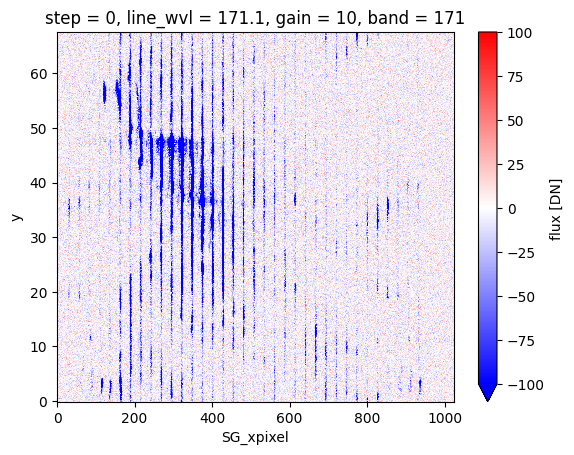

In [81]:
band = spec_diff_removed.band[1]
aa = specsum_only_core.flux.sel(band=band)
bb = specsum_diff.flux.sel(band=band)
(aa-bb).isel(step=0).plot(vmin=-100, vmax=100, cmap='bwr')

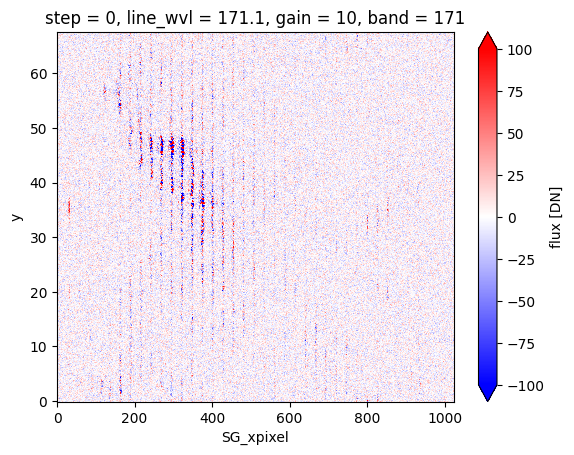

In [82]:
band = spec_diff_removed.band[1]
aa = specsum_only_core.flux.sel(band=band)
bb = spec_diff_removed.flux.sel(band=band)
(aa-bb).isel(step=0).plot(vmin=-100, vmax=100, cmap='bwr')

In [83]:
band = spec_diff_removed.band[1]
aa = spec_diff_removed.flux.sel(band=band)
bb = spec_diff_removed_inv.flux.swap_dims({'line':'band'}).sel(band=band).sum(dim=['slit', 'band'])
(aa-bb).isel(step=0).plot(vmin=-5, vmax=5, cmap='bwr')

NameError: name 'spec_diff_removed_inv' is not defined

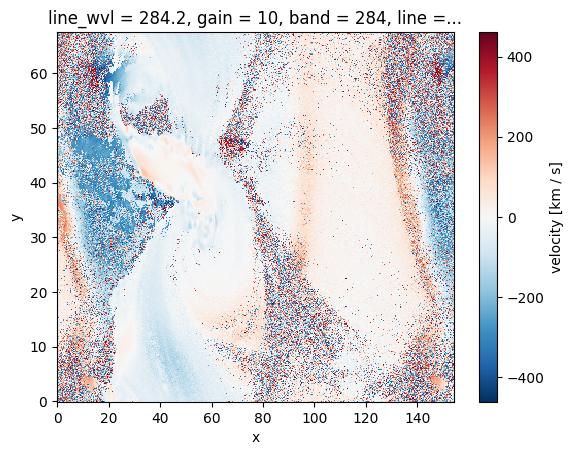

In [77]:
mom_only_core.velocity.isel(line=1).plot()

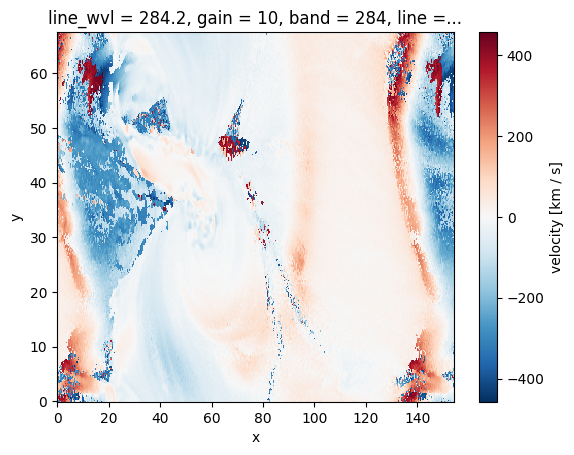

In [78]:
mom_diff_removed.velocity.isel(line=1).plot()

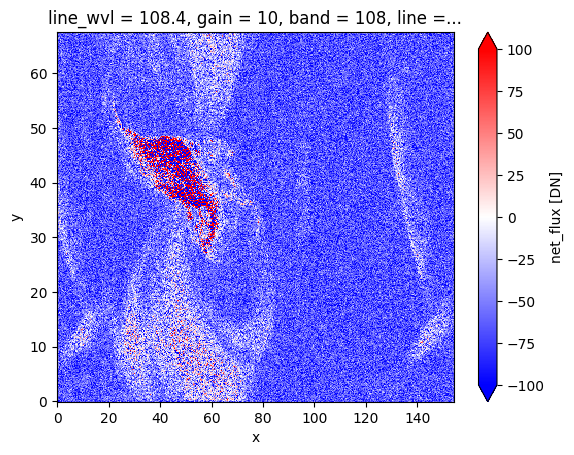

In [86]:
(mom_diff_removed-mom_only_core).net_flux.isel(line=2).plot(vmin=-100, vmax=100, cmap='bwr')

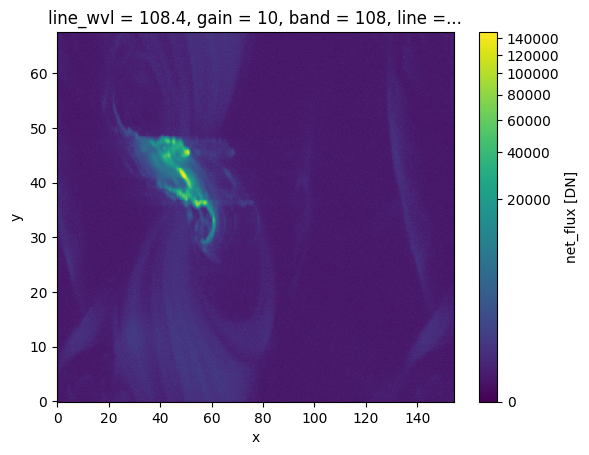

In [88]:
(mom_diff).net_flux.isel(line=2).plot(norm=pn)

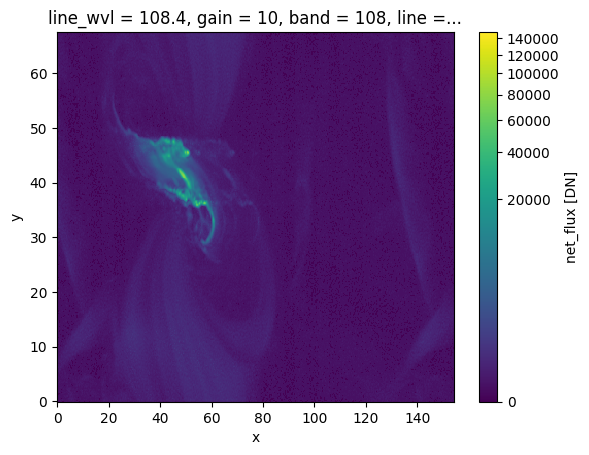

In [89]:
(mom_diff_removed).net_flux.isel(line=2).plot(norm=pn)